In [160]:
# Importing necessary packages.
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno
import plotly.express as px
from statsmodels.tsa.stattools import adfuller, acf, pacf   # Augmented Dickey Fuller Test.
from statsmodels.tsa.seasonal import seasonal_decompose     # Decomposition technique.
from statsmodels.tsa.arima.model import ARIMA               # ARIMA Model.
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [2]:
# Read the dataset.
sales = pd.read_csv('Walmart.csv')
sales.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


## About the Dataset:
1. Store        - Store ID.
2. Date         - When the sales was happened.
3. Weekly_Sales - How much sales has happened.
4. Holiday_Flag - If it was a holiday or not.
5. Temperature  - Temperature on that day.
6. Fuel_Price   - Price of Fuel on that day.
7. CPI          - Customer Purchasing Index.
8. Unemployment - Unemployment rate on that day.

## Target Variable - Weekly_Sales.

In [3]:
# Take a copy of the original dataframe for analysis and manipulation.
sales_copy = sales.copy()
sales_copy.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [4]:
# Info of the dataset.
sales_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [5]:
# Check for null values.
sales_copy.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

There are no null values observed in this dataset.

<Axes: >

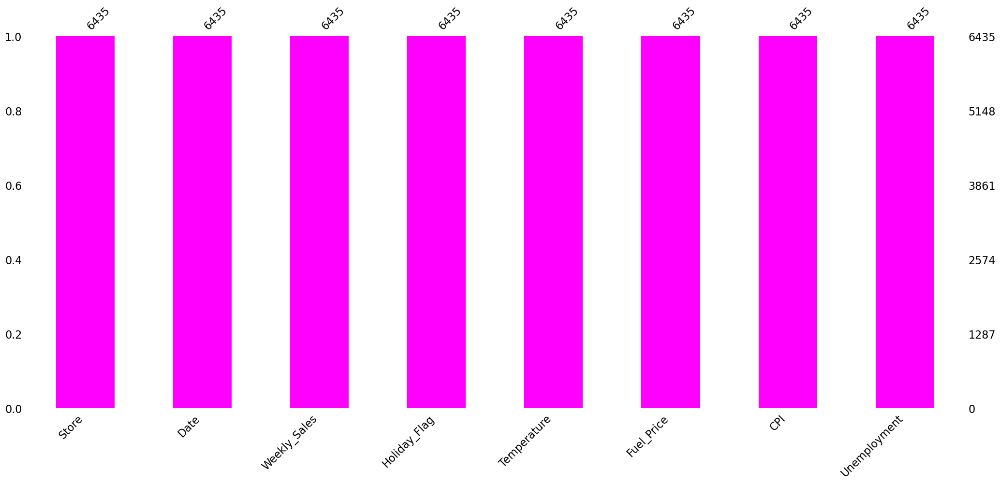

In [6]:
# Let's visualize the null values using bar.

msno.bar(sales_copy, color = 'magenta')

In [7]:
# Shape of the dataset.
sales_copy.shape

(6435, 8)

In [8]:
# Duplicate rows.
sales_copy.duplicated().sum()

0

There are no duplicates observed.

In [11]:
# Fetch numerical and categorical features.
num_features = [feature for feature in sales_copy.columns if sales_copy[feature].dtype != object and feature != 'Holiday_Flag']
cat_features = ['Holiday_Flag']
print(f'Numerical Features : {num_features}')
print(f'Categorical Features : {cat_features}')

Numerical Features : ['Store', 'Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
Categorical Features : ['Holiday_Flag']


In [12]:
# Let's visualize the presence of outliers using box plot.

for col in num_features:
    fig = px.box(x = col, data_frame = sales_copy)
    fig.show()

Weekly_Sales, Temperature & Unemployment features has few outliers.

In [13]:
# Function to fetch the list of indices that has outliers.

def outlier_indices(dataframe,feature,quantile_val1,quantile_val3):
    q1 = dataframe[feature].quantile(quantile_val1)
    q3 = dataframe[feature].quantile(quantile_val3)
    
    IQR = q3 - q1
    
    lower_fence = q1 - 1.5 * IQR
    upper_fence = q3 + 1.5 * IQR
    
    outlier_indices = dataframe[(dataframe[feature] < lower_fence) | (dataframe[feature] > upper_fence)].index
    return outlier_indices

In [14]:
# Call outlier_indices function.
index_list = []

outlier_features = ['Weekly_Sales', 'Temperature', 'Unemployment']

for col in outlier_features:
    index_list.extend(outlier_indices(sales_copy,col,0.25,0.75))

In [16]:
# Length of unique indexes that has outliers.
len(set(index_list))

518

In [17]:
# Function to remove the outlier indices.
def remove_outliers(dataframe,index):
    index = sorted(set(index))
    dataframe = dataframe.drop(index)
    return dataframe

In [18]:
# Call remove_outliers function.

print(f'Shape of data before outlier removal : {sales_copy.shape}')
sales_copy = remove_outliers(sales_copy,index_list)
print(f'Shape of data after outlier removal  : {sales_copy.shape}')

Shape of data before outlier removal : (6435, 8)
Shape of data after outlier removal  : (5917, 8)


In [19]:
# Visualization of box plot after outlier removal.

for col in num_features:
    fig = px.box(x = col, data_frame = sales_copy)
    fig.show()

In [20]:
# Fetch the list of stores that are present in this dataset.
sales_copy['Store'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

In [22]:
# Calculate the total weekly sales happened on each store.
store_sales_df = sales_copy.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=False).reset_index(name='Total_Sales')
store_sales_df

,Store,Total_Sales
0,20,2.800237e+08
1,14,2.761276e+08
2,2,2.687221e+08
3,13,2.682025e+08
4,10,2.556789e+08
5,27,2.480387e+08
6,4,2.446487e+08
7,1,2.224028e+08
8,6,2.210286e+08
9,39,2.074455e+08


Store 20 has the highest sales whereas store 38 has the lowest sales.

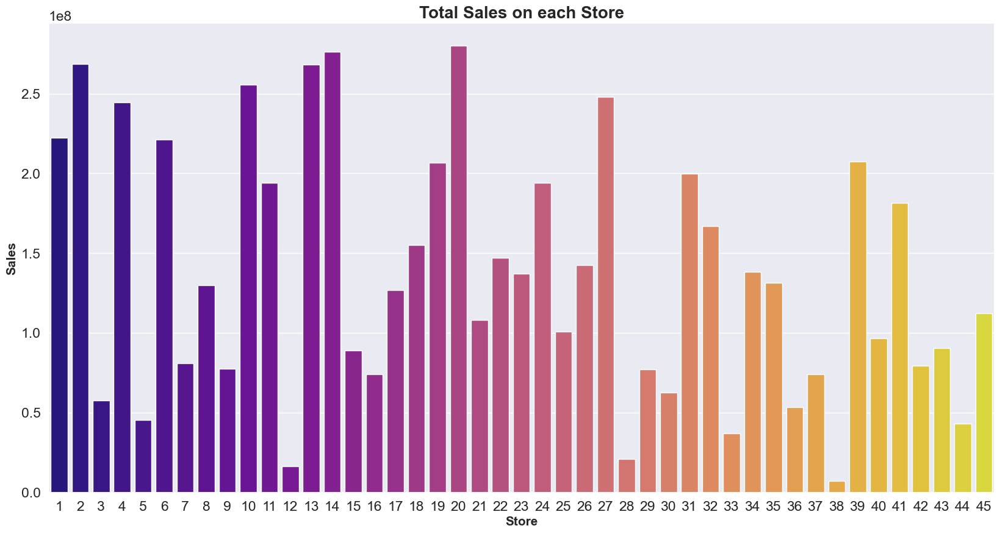

In [27]:
# Let's visualize the above using bar plot.

plt.figure(figsize = (20,10))
sns.set_style('whitegrid')
sns.set(font_scale = 1.5)
sns.barplot(y = 'Total_Sales', x = 'Store', data = store_sales_df, palette = 'plasma')
plt.title('Total Sales on each Store', fontsize = 20, fontweight = 'bold')
plt.xlabel('Store', fontsize = 15, fontweight = 'bold')
plt.ylabel('Sales', fontsize = 15, fontweight = 'bold')
plt.show()

In [28]:
# Convert Date feature datatype from object to datetime.

sales_copy['Date'] = pd.to_datetime(sales_copy['Date'])

In [29]:
sales_copy['Date'].dtype

dtype('<M8[ns]')

In [30]:
# Calculate the total weekly sales happened on each day.
date_sales_df = sales_copy.groupby('Date')['Weekly_Sales'].sum().sort_values(ascending = False).reset_index(name = 'Total_Sales')
date_sales_df

,Date,Total_Sales
0,2011-09-12,52469075.31
1,2011-11-25,50952926.03
2,2010-10-12,49970584.44
3,2011-12-23,49555736.89
4,2011-12-16,48663492.73
...,...,...
138,2010-12-31,38146314.71
139,2012-01-13,37761100.64
140,2012-01-20,37731959.98
141,2011-01-28,36423831.94


Highest Sales has happened on Sep 12,2011 whereas lowest sales has happened on Jan 27,2012.

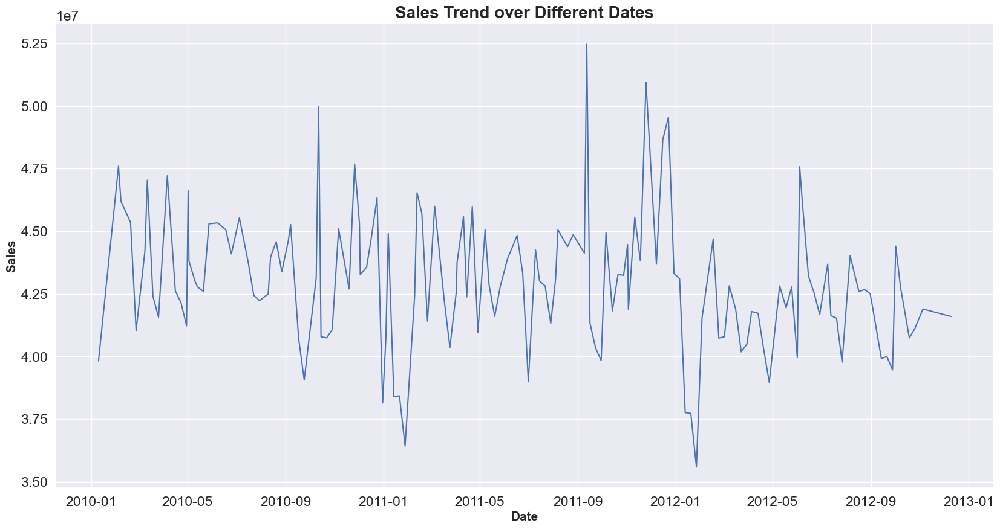

In [31]:
# Let's visualize the sales trend on each day as calculated above.

plt.figure(figsize = (20,10))
plt.title('Sales Trend over Different Dates', fontsize = 20, fontweight = 'bold')
sns.lineplot(x = 'Date', y = 'Total_Sales', data = date_sales_df, palette='plasma')
plt.xlabel('Date', fontsize = 15, fontweight = 'bold')
plt.ylabel('Sales', fontsize = 15, fontweight = 'bold')
plt.show()

## Inference:

Most of the sales are ranging between 40000000 - 50000000.

In [32]:
# Calculate the total weekly sales happened on a holiday and on a non-holiday.

holiday_sales_df = sales_copy.groupby('Holiday_Flag')['Weekly_Sales'].sum().sort_values(ascending = False).reset_index(name = 'Total_Sales')
holiday_sales_df

,Holiday_Flag,Total_Sales
0,0,5.704333e+09
1,1,4.452825e+08


Sales has happened the highest during non-holidays when compared to holidays.

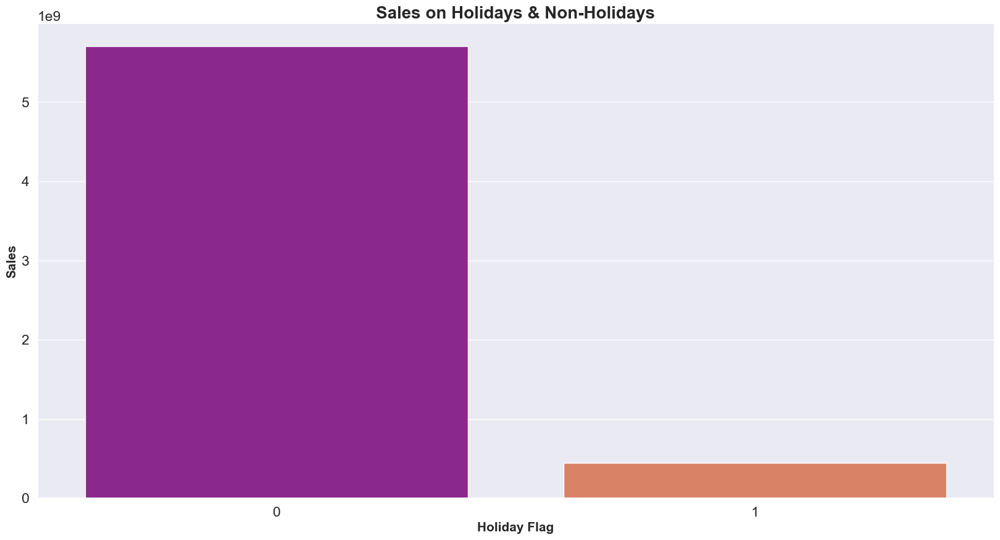

In [33]:
# Let's visualize the above statement using barplot.

plt.figure(figsize = (20,10))
plt.title('Sales on Holidays & Non-Holidays', fontsize = 20, fontweight = 'bold')
sns.barplot(x = 'Holiday_Flag', y = 'Total_Sales', data = holiday_sales_df, palette = 'plasma')
plt.xlabel('Holiday Flag', fontsize = 15, fontweight = 'bold')
plt.ylabel('Sales', fontsize = 15, fontweight = 'bold')
plt.show()

## Sales happened based on different temperatures.

In [34]:
# Fetch the minimum temp.

sales_copy['Temperature'].min()

7.46

In [35]:
# Fetch the maximum temp.

sales_copy['Temperature'].max()

100.14

In [48]:
# Let's create bins between 0-101.

bins = [0,25,50,75,101]
labels = ['0-25','26-50','51-75','76-101']

In [49]:
# Let's create a new feature 'Temp_Range' for the above bins.

sales_copy['Temp_Range'] = pd.cut(sales_copy['Temperature'], bins = bins, labels = labels)

In [50]:
sales_copy['Temp_Range'].value_counts()

51-75     2732
26-50     1528
76-101    1447
0-25       210
Name: Temp_Range, dtype: int64

In [51]:
# Let's calculate the sales pattern based on temperature.

temp_sales_df = sales_copy.groupby('Temp_Range')['Weekly_Sales'].sum().sort_values(ascending=False).reset_index(name='Total_Sales')
temp_sales_df

,Temp_Range,Total_Sales
0,51-75,2.859760e+09
1,26-50,1.661846e+09
2,76-101,1.435407e+09
3,0-25,1.926020e+08


Highest sales has happened when the temp was between 51-75 and the lowest sales has happened when the temperature was between 0-25. This is obvious as most people prefer shopping when the temp is moderate and not when temp is too low/high.

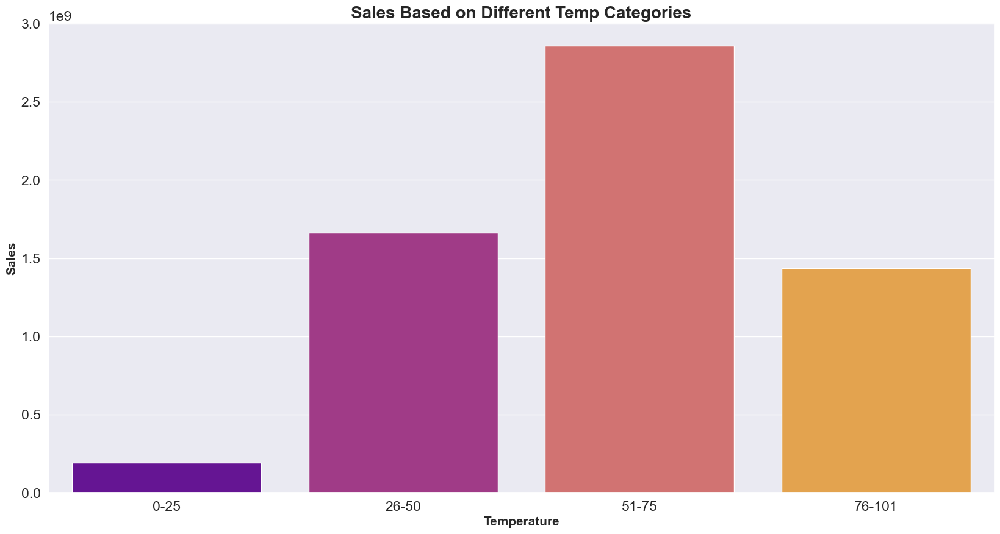

In [52]:
# Let's visualize the above statement using barplot.

plt.figure(figsize = (20,10))
plt.title('Sales Based on Different Temp Categories', fontsize = 20, fontweight = 'bold')
sns.barplot(x = 'Temp_Range', y = 'Total_Sales', data = temp_sales_df, palette = 'plasma')
plt.xlabel('Temperature', fontsize = 15, fontweight = 'bold')
plt.ylabel('Sales', fontsize = 15, fontweight = 'bold')
plt.show()

## Sales happened based on different Fuel Prices.

In [53]:
# Minimum fuel price.

sales_copy['Fuel_Price'].min()

2.472

In [54]:
# Maximum fuel price.

sales_copy['Fuel_Price'].max()

4.468

In [55]:
# Let's create bins between 2-4.5.

bins_fuel = [2,2.5,3,3.5,4,4.5]
labels_fuel = ['2-2.5','2.6-3.0','3.1-3.5','3.6-4.0','4.1-4.5']

In [56]:
sales_copy['Fuel_Category'] = pd.cut(sales_copy['Fuel_Price'], bins = bins_fuel, labels=labels_fuel)

In [57]:
sales_copy['Fuel_Category'].value_counts()

3.6-4.0    2406
2.6-3.0    1833
3.1-3.5    1362
4.1-4.5     315
2-2.5         1
Name: Fuel_Category, dtype: int64

In [58]:
# let's calculate the sales pattern based on Fuel_Category.

fuel_sales_df = sales_copy.groupby('Fuel_Category')['Weekly_Sales'].sum().sort_values(ascending=False).reset_index(name='Total_Sales')
fuel_sales_df

,Fuel_Category,Total_Sales
0,3.6-4.0,2.500333e+09
1,2.6-3.0,1.895000e+09
2,3.1-3.5,1.418658e+09
3,4.1-4.5,3.351540e+08
4,2-2.5,4.702810e+05


Sales happened to be high when Fuel price is between 3.6 - 4.0 whereas it is low when fuel price is between 2 - 2.5

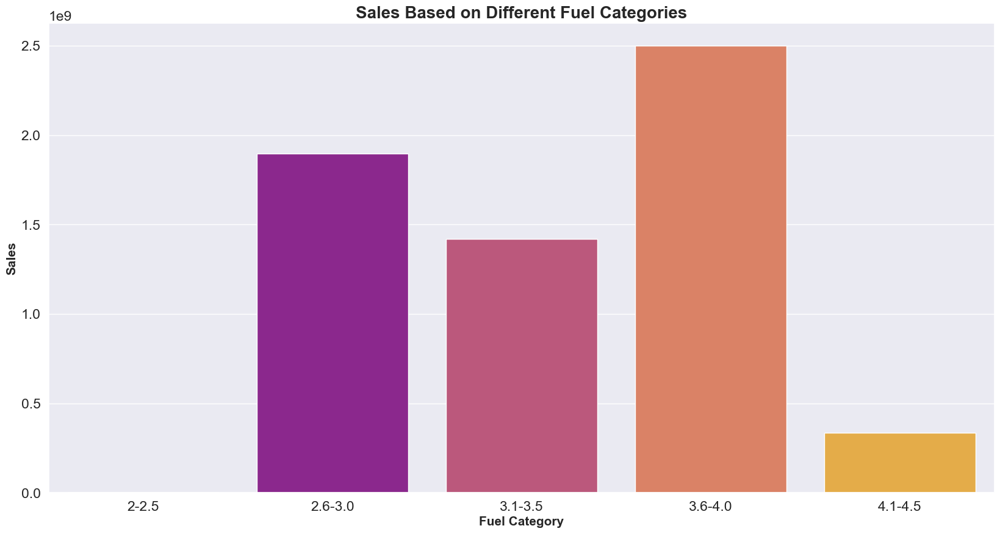

In [60]:
# Let's visualize the above statement using barplot.

plt.figure(figsize = (20,10))
plt.title('Sales Based on Different Fuel Categories', fontsize = 20, fontweight = 'bold')
sns.barplot(x = 'Fuel_Category', y = 'Total_Sales', data = fuel_sales_df, palette = 'plasma')
plt.xlabel('Fuel Category', fontsize = 15, fontweight = 'bold')
plt.ylabel('Sales', fontsize = 15, fontweight = 'bold')
plt.show()

Sales are high when the price of fuel is moderate (3.6-4.0). However, when the prices were low, there was not much of sales happened. May be due to rise in temperature or any other factors that would've affected the sales.

## Sales happened on different CPIs.

In [61]:
# Minimum CPI.

sales_copy['CPI'].min()

126.064

In [62]:
# Maximum CPI.

sales_copy['CPI'].max()

227.2328068

In [63]:
# Let's create bins between 125 - 230.

bins_cpi = [125,150,175,200,225,250]
labels_cpi = ['125-150','151-175','176-200','201-225','226-250']

In [64]:
sales_copy['CPI_category'] = pd.cut(sales_copy['CPI'], bins = bins_cpi, labels=labels_cpi)

In [65]:
sales_copy['CPI_category'].value_counts()

125-150    2643
201-225    2299
176-200     853
226-250     122
151-175       0
Name: CPI_category, dtype: int64

In [66]:
# Let's calculate the sales happened based on different CPI categories.

cpi_sales_df = sales_copy.groupby('CPI_category')['Weekly_Sales'].sum().sort_values(ascending=False).reset_index(name='Total_Sales')
cpi_sales_df

,CPI_category,Total_Sales
0,125-150,2.863560e+09
1,201-225,2.294569e+09
2,176-200,8.919768e+08
3,226-250,9.950931e+07
4,151-175,0.000000e+00


Higher Sales happened when CPI is between 125 - 150. In contrast, lower sales happened when CPI is between 226-250. This is because when the prices of goods increases, their sales will automatically decrease.

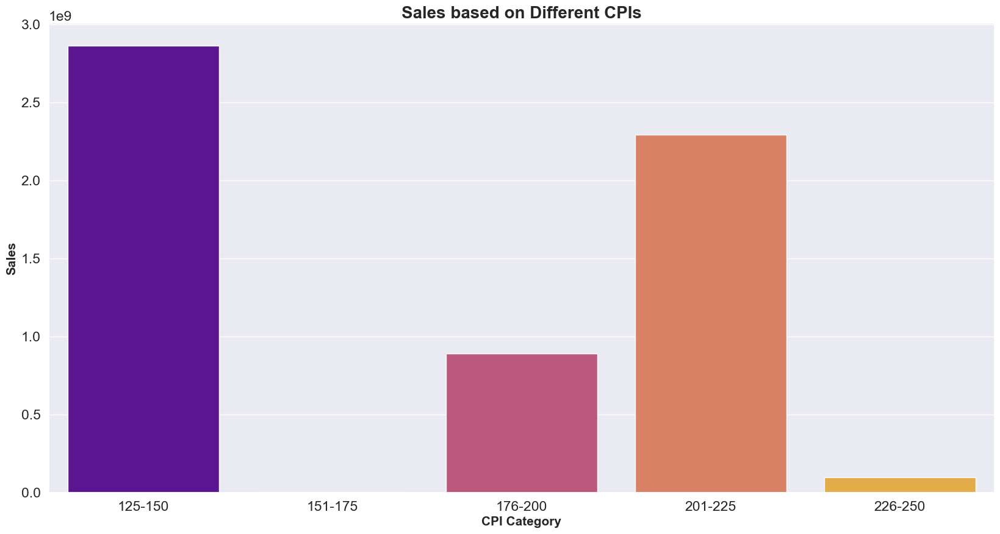

In [67]:
# Let's visualize the above statement using barplot.

plt.figure(figsize = (20,10))
plt.title('Sales based on Different CPIs', fontsize = 20, fontweight = 'bold')
sns.barplot(x = 'CPI_category', y = 'Total_Sales', data = cpi_sales_df, palette = 'plasma')
plt.xlabel('CPI Category', fontsize = 15, fontweight = 'bold')
plt.ylabel('Sales', fontsize = 15, fontweight = 'bold')
plt.show()

## Sales based on different unemployment rates.

In [68]:
# Minimum unemployment rate.

sales_copy['Unemployment'].min()

4.308

In [69]:
# Maximum unemployment rate.

sales_copy['Unemployment'].max()

10.926

In [70]:
# Let's create bins between 4 - 12.

bins_unemp = [4, 6, 8, 10, 12]
labels_unemp = ['4-6','6.1-8','8.1-10','10.1-12']

In [71]:
sales_copy['Unemployment_Category'] = pd.cut(sales_copy['Unemployment'], bins = bins_unemp, labels = labels_unemp)

In [72]:
sales_copy['Unemployment_Category'].value_counts()

6.1-8      2772
8.1-10     2379
4-6         515
10.1-12     251
Name: Unemployment_Category, dtype: int64

In [76]:
# Let's calculate the sales happened based on Unemployment_Category.

unemp_sales_df = sales_copy.groupby('Unemployment_Category')['Weekly_Sales'].sum().sort_values(ascending = False).reset_index(name = 'Total_Sales')
unemp_sales_df

,Unemployment_Category,Total_Sales
0,6.1-8,2.913154e+09
1,8.1-10,2.464966e+09
2,4-6,5.858215e+08
3,10.1-12,1.856744e+08


Sales has happened high when unemployment rate is moderate (6.1 - 8). However, least sales has happened when unemployment rate is between 10.1-12 which is obvious as most people won't have much spending power as they are unemployed.

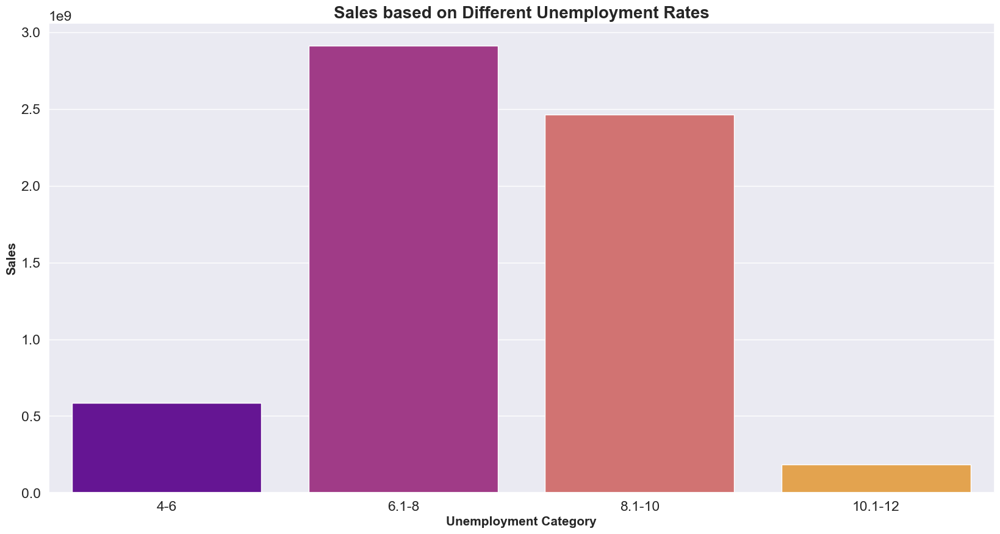

In [77]:
# Let's visualize the above statement using barplot.

plt.figure(figsize = (20,10))
plt.title('Sales based on Different Unemployment Rates', fontsize = 20, fontweight = 'bold')
sns.barplot(x = 'Unemployment_Category', y = 'Total_Sales', data = unemp_sales_df, palette = 'plasma')
plt.xlabel('Unemployment Category', fontsize = 15, fontweight = 'bold')
plt.ylabel('Sales', fontsize = 15, fontweight = 'bold')
plt.show()

Sales are good when unemployment rate is between 6 - 10.

## Forecasting Sales using ARIMA modelling.

In [78]:
sales_copy.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Temp_Range,Fuel_Category,CPI_category,Unemployment_Category
0,1,2010-05-02,1643690.90,0,42.31,2.572,211.096358,8.106,26-50,2.6-3.0,201-225,8.1-10
1,1,2010-12-02,1641957.44,1,38.51,2.548,211.242170,8.106,26-50,2.6-3.0,201-225,8.1-10
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,26-50,2.6-3.0,201-225,8.1-10
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,26-50,2.6-3.0,201-225,8.1-10
4,1,2010-05-03,1554806.68,0,46.50,2.625,211.350143,8.106,26-50,2.6-3.0,201-225,8.1-10


In [80]:
# Let's consider only Date and Weekly_Sales features for model training.

sales_train = sales_copy.copy()

sales_train = sales_train[['Date','Weekly_Sales']]
sales_train.head()

,Date,Weekly_Sales
0,2010-05-02,1643690.90
1,2010-12-02,1641957.44
2,2010-02-19,1611968.17
3,2010-02-26,1409727.59
4,2010-05-03,1554806.68


In [81]:
sales_train.shape

(5917, 2)

In [82]:
sales_train['Date'].nunique()

143

In [83]:
# As we have only 143 unique values for Date feature, we will do a groupby of date with total sum of sales on that day.

sales_train = sales_train.groupby('Date')['Weekly_Sales'].sum().reset_index()
sales_train.head()

,Date,Weekly_Sales
0,2010-01-10,39825602.62
1,2010-02-04,47601520.01
2,2010-02-07,46204385.56
3,2010-02-19,45363033.79
4,2010-02-26,41043557.90


In [84]:
sales_train.shape

(143, 2)

In [85]:
# Let's set the date column as index.

sales_train.set_index('Date', inplace = True)

In [86]:
sales_train.head()

,Weekly_Sales
Date,
2010-01-10,39825602.62
2010-02-04,47601520.01
2010-02-07,46204385.56
2010-02-19,45363033.79
2010-02-26,41043557.90


1. Now this is a univariate time series analysis as we have only one feature (Weekly_Sales) and Date as index.
2. Date is serving as index to maintain the chronological order (order sequence) for better forecasting.
3. Let's try to apply ARIMA modelling which requires the assumption that the data needs to be stationary to be satisfied.

In [97]:
# Augmented Dickey Fuller Test function to check for stationarity.

def stationarity_check(dataframe, feature):
    print('Augmented Dickey Fuller Test (ADF Test)')
    adf_test = adfuller(dataframe[feature])
    labels = ['T-stats','p-value','# Lags used', '# Observations used']
    adf_out = pd.Series(adf_test[0:4], index=labels)
    
    for key,value in adf_test[4].items():
        adf_out[f'Critical Value ({key})'] = value
    
    if adf_test[1] <= 0.05:
        print('Data is stationary')
    else:
        print('Data is non-stationary and needs some differencing')
    
    return adf_out

In [94]:
# adf_test = adfuller(sales_train['Weekly_Sales'])
# adf_test

In [95]:
# adf_test[4].items()

In [98]:
# Call stationarity check function to check for stationarity.

stationarity_check(sales_train,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -9.318726e+00
p-value                 1.002629e-15
# Lags used             0.000000e+00
# Observations used     1.420000e+02
Critical Value (1%)    -3.477262e+00
Critical Value (5%)    -2.882118e+00
Critical Value (10%)   -2.577743e+00
dtype: float64

## Inference:

T-stats is less than the critical values of 1%, 5% & 10%.

In [100]:
# Let's use the decomposition technique as part of EDA to check for trends, seasonality & Noise.

decomposition = seasonal_decompose(sales_train['Weekly_Sales'], model='additive', period=13)

# period = 13 is set to denote that seasonality repeats for every 13 observations i.e., every 13 weeks in a quarter.

<Figure size 2000x1000 with 0 Axes>

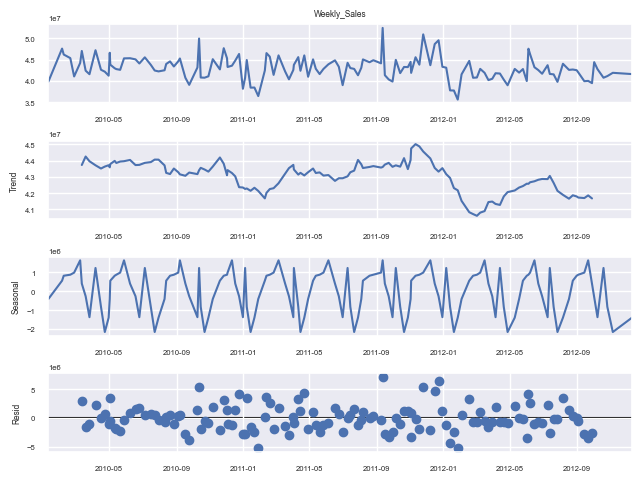

In [111]:
# Plotting the decomposition.

plt.figure(figsize = (20,10))
sns.set(font_scale = 0.5)
decomposition.plot()
plt.show()

## Inference:

We can observe that trend has got to the maximum during Q3 of 2011 whereas it has reached the minimum during Q1 of 2012.

In [112]:
# Let's calculate rolling mean and rolling std dev for the past 9 weeks.

roll_mean1 = sales_train.rolling(window=10).mean()
roll_std1  = sales_train.rolling(window=10).std()

# window = 10 --> For each row, it computes mean and std dev. of the current week and previous 9 weeks.

1. Rolling Mean - smooths the data by avoiding short-term fluctuations thereby providing insights on long term trends.
2. Rolling std dev - Captures every changes (variability/volatality) in the data thereby helping to identify the periods of high & low volatality.

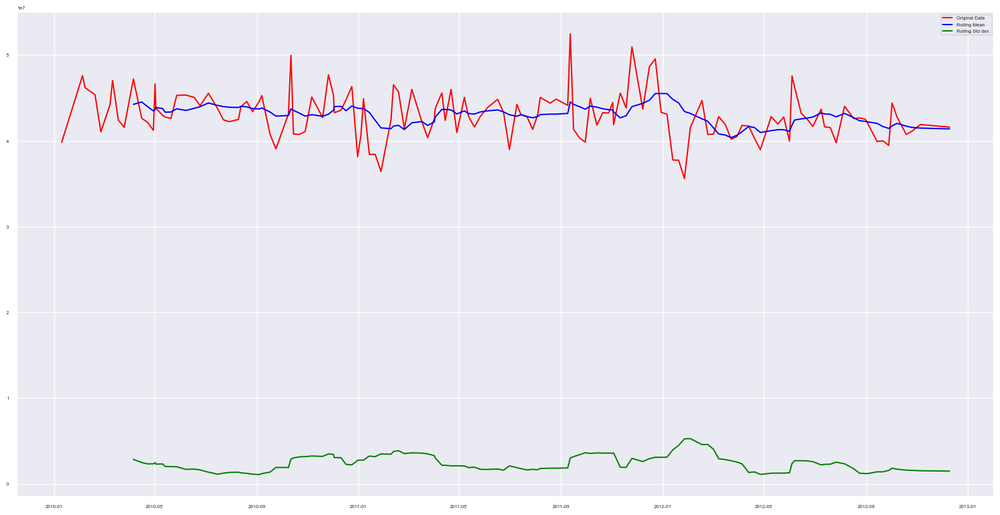

In [138]:
# Let's visualize the above rolling mean and std dev with that of original data.

plt.figure(figsize = (20,10))
plt.plot(sales_train['Weekly_Sales'], color = 'red', label = 'Original Data')
plt.plot(roll_mean1, color = 'blue', label='Rolling Mean')
plt.plot(roll_std1, color = 'green', label = 'Rolling Std dev.')
plt.legend()
plt.show()

As expected, rolling mean pattern has captured the long term trends in the data by removing short term fluctuations where as rolling std dev has captured the variability or changes in the data to help us identify the periods when the sales were high or low than usual.

In [119]:
# Let's apply log transformation to the weekly sales data.

sales_log = np.log(sales_train)
sales_log

,Weekly_Sales
Date,
2010-01-10,17.500021
2010-02-04,17.678375
2010-02-07,17.648585
2010-02-19,17.630208
2010-02-26,17.530144
...,...
2012-10-08,17.571251
2012-10-19,17.522815
2012-10-26,17.532146


## Points to Note:

1. Even though the data is stationary, log transformation can still be applied to stabilize the variation/spread in the data i.e., to achieve homoscedasticity.
2. As log transformation helps in stabilizing the variance, this can eventually result in removing outliers from the data.
3. Only the weekly_sales has been log transformed and the date remains the same. This is one of the reason why we are setting the index as date.

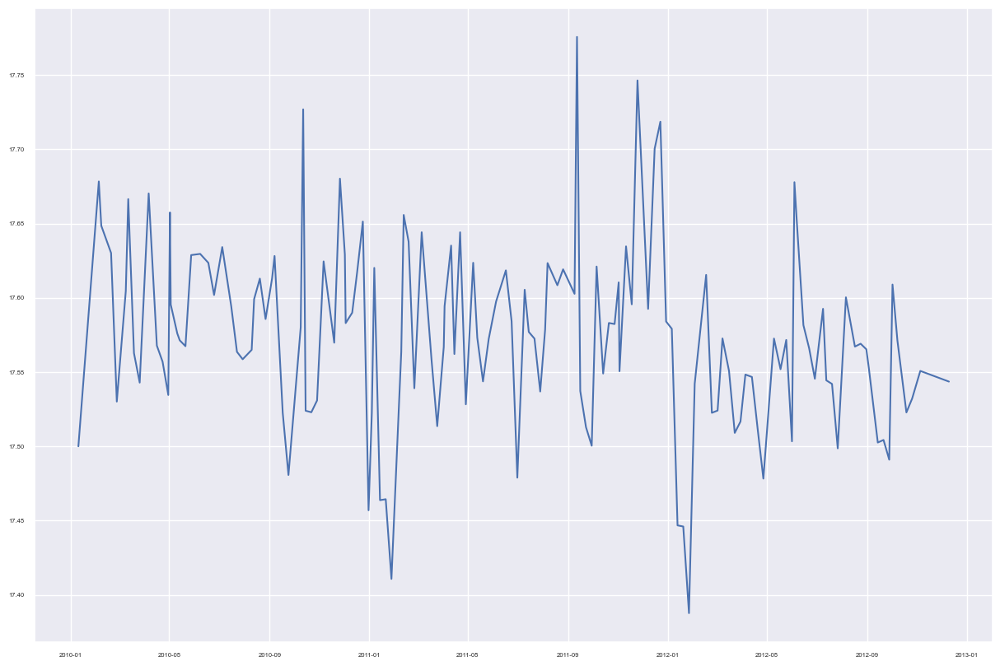

In [137]:
# Perform visualization of the log transformed data.
plt.figure(figsize = (15,10))
plt.plot(sales_log)
plt.show()

In [123]:
# Let's apply rolling mean and rolling std dev for the log transformed data.

roll_mean2 = sales_log.rolling(window = 10).mean()
roll_std2  = sales_log.rolling(window = 10).std()

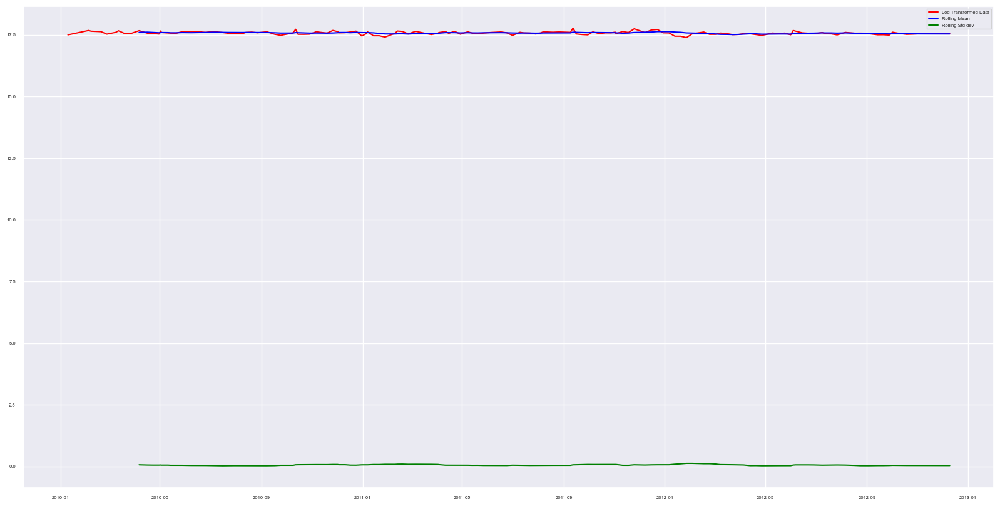

In [136]:
# Let's visualize the above rolling mean and std dev with that of original data.

plt.figure(figsize = (20,10))
plt.plot(sales_log['Weekly_Sales'], color = 'red', label = 'Log Transformed Data')
plt.plot(roll_mean2, color = 'blue', label = 'Rolling Mean')
plt.plot(roll_std2, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.show()

1. As expected, the log transformation has helped us in reducing the variance within the data due to which rolling std dev has become almost constant.
2. Also, the mean values will be almost same as the log transformed values.

In [125]:
roll_mean2

,Weekly_Sales
Date,
2010-01-10,NaN
2010-02-04,NaN
2010-02-07,NaN
2010-02-19,NaN
2010-02-26,NaN
...,...
2012-10-08,17.553293
2012-10-19,17.545540
2012-10-26,17.542038


In [126]:
sales_log

,Weekly_Sales
Date,
2010-01-10,17.500021
2010-02-04,17.678375
2010-02-07,17.648585
2010-02-19,17.630208
2010-02-26,17.530144
...,...
2012-10-08,17.571251
2012-10-19,17.522815
2012-10-26,17.532146


In [128]:
# Let's subtract rolling mean with log transformed data points to make all the datapoints closer to zero with mean as ~0.
# This is similar to how we Standardization process.

sales_scaled = sales_log - roll_mean2
sales_scaled.head(20)

,Weekly_Sales
Date,
2010-01-10,NaN
2010-02-04,NaN
2010-02-07,NaN
2010-02-19,NaN
2010-02-26,NaN
2010-03-09,NaN
2010-03-12,NaN
2010-03-19,NaN
2010-03-26,NaN


In [129]:
sales_scaled.shape

(143, 1)

In [130]:
# Let's drop the null values.

sales_scaled = sales_scaled.dropna(axis = 0)

,Weekly_Sales
Date,
2010-04-06,0.066867
2010-04-16,-0.042400
2010-04-23,-0.041077
2010-04-30,-0.052112
2010-05-02,0.068114
2010-05-03,-0.000496
2010-05-11,-0.017084
2010-05-14,-0.012187
2010-05-21,-0.016606


In [131]:
sales_scaled.head()

,Weekly_Sales
Date,
2010-04-06,0.066867
2010-04-16,-0.042400
2010-04-23,-0.041077
2010-04-30,-0.052112
2010-05-02,0.068114


In [132]:
sales_scaled.shape

(134, 1)

In [133]:
# Let's check the rolling mean and rolling std dev for scaled data.
roll_mean3 = sales_scaled.rolling(window = 10).mean()
roll_std3  = sales_scaled.rolling(window = 10).std()

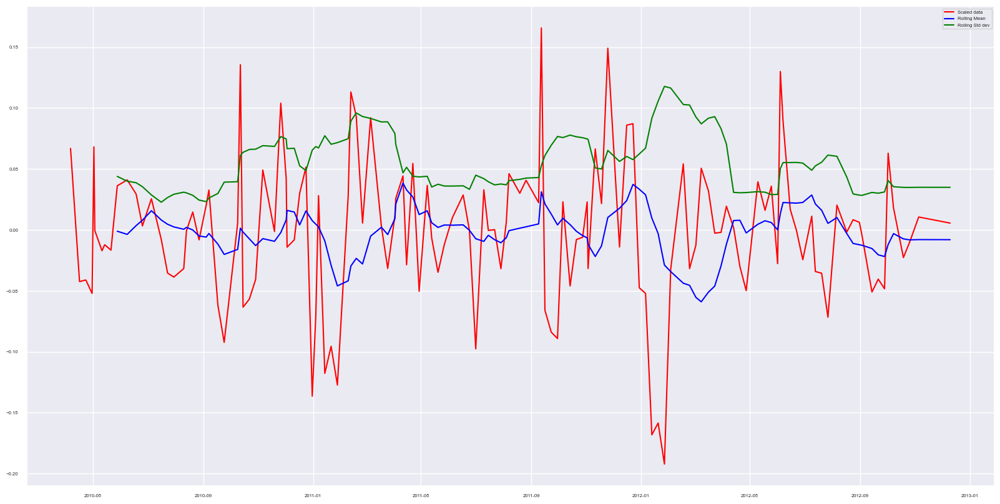

In [135]:
# Let's visualize the above rolling mean and std dev with that of scaled data.

plt.figure(figsize = (20,10))
plt.plot(sales_scaled, color = 'red', label = 'Scaled data')
plt.plot(roll_mean3, color = 'blue', label = 'Rolling Mean')
plt.plot(roll_std3, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.show()

As the data is scaled, rolling mean and rolling std dev is almost closer to each other.

In [139]:
# Now, let's check the stationarity for this scaled data by calling stationarity_check function.

stationarity_check(sales_scaled, 'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -6.337558e+00
p-value                 2.806235e-08
# Lags used             5.000000e+00
# Observations used     1.280000e+02
Critical Value (1%)    -3.482501e+00
Critical Value (5%)    -2.884398e+00
Critical Value (10%)   -2.578960e+00
dtype: float64

## Inference:

Even after log transformation and scaling, the data still seems to be stationary which is a good sign.

In [142]:
# Correlation values of acf & pacf at different lag values.
corr_acf = acf(sales_scaled)
corr_pacf = pacf(sales_scaled)
corr_acf, corr_pacf

(array([ 1.00000000e+00,  2.69292070e-01,  6.94795023e-02, -5.77875623e-02,
         5.77216527e-02, -1.66532843e-01, -2.94324566e-01, -1.84218023e-01,
        -1.31463702e-01, -1.46855234e-01, -1.18589768e-01,  8.70575283e-03,
         8.44289211e-02,  5.45930269e-02,  8.04120288e-02,  1.20435146e-01,
         3.67094571e-02, -7.36109914e-04, -9.80580675e-02, -1.06939006e-01,
        -1.84638130e-01,  1.20363507e-02]),
 array([ 1.        ,  0.27131682, -0.00332539, -0.08356093,  0.10530834,
        -0.23009852, -0.24469207, -0.02065622, -0.12648795, -0.13586939,
        -0.056468  , -0.04104058, -0.01914834, -0.04776715, -0.007009  ,
         0.0113246 , -0.11156306, -0.02630381, -0.14979635, -0.15858869,
        -0.1929845 ,  0.09860276]))

## Inference:

At log 0 in both ACF & PACF, the correlation will always be 1. This is because, the correlation of current value with itself (lag 0) will always be 1.

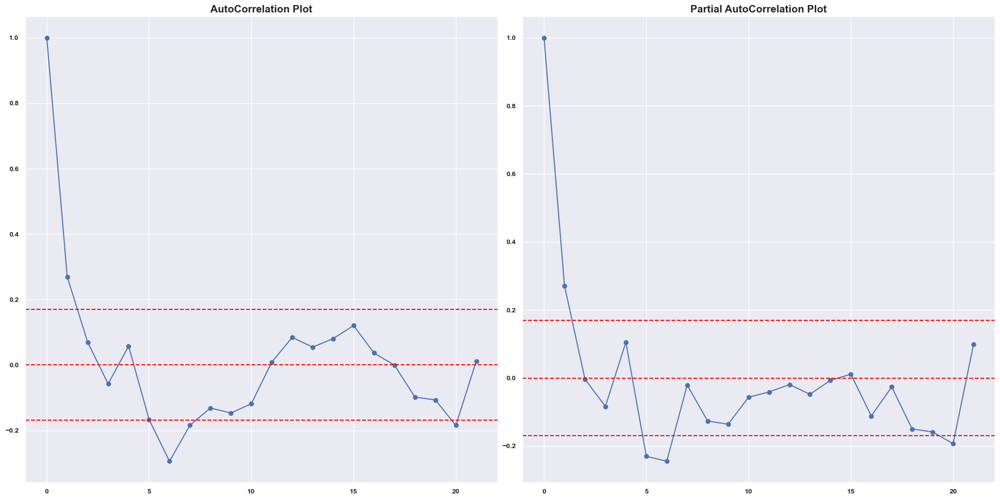

In [146]:
# Let's visualize ACF & PACF plots.

plt.figure(figsize = (20,10))
plt.subplot(1,2,1)
plt.title('AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(corr_acf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(sales_scaled)), linestyle = '--', color = 'red')  # 95% confidence interval band.
plt.axhline(y = 1.96/np.sqrt(len(sales_scaled)), linestyle = '--', color = 'red')   # 95% confidence interval band.
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()

plt.subplot(1,2,2)
plt.title('Partial AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(corr_pacf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(sales_scaled)), linestyle = '--', color = 'red')
plt.axhline(y = 1.96/np.sqrt(len(sales_scaled)), linestyle = '--', color = 'red')
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()
plt.show()

## Observation:

* Moving Average (q) = 4
* Auto Regressive (p) = 5

In [150]:
# Let's train ARIMA model with p,d,q = (5,0,4)

model = ARIMA(sales_scaled, order = (5,0,4))
model_fit = model.fit()

In [152]:
# Perform Predictions on historical data.

model_pred = model_fit.predict()
model_pred

Date
2010-04-06   -0.001527
2010-04-16    0.016012
2010-04-23   -0.012809
2010-04-30   -0.018553
2010-05-02   -0.003586
                ...   
2012-10-08    0.012193
2012-10-19    0.015798
2012-10-26   -0.003155
2012-11-05    0.021506
2012-12-10    0.012170
Name: predicted_mean, Length: 134, dtype: float64

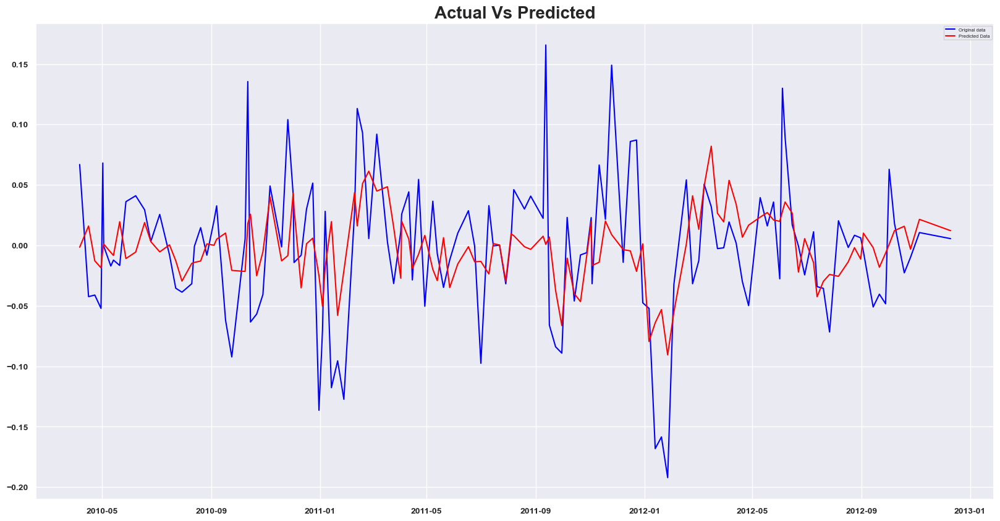

In [159]:
# Let's visualize the actual & predicted values.

plt.figure(figsize = (20,10))
plt.plot(sales_scaled, color = 'blue', label = 'Original data')
plt.plot(model_pred, color = 'red', label = 'Predicted Data')
plt.title('Actual Vs Predicted', fontsize = 20, fontweight = 'bold')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

## Observation:

The actual & predicted values are almost the same which denotes that the model has performed well. However, let's see them numerically in terms of error.

In [165]:
# Model Evaluation.

print(f'Mean Absolute Error : {mean_absolute_error(sales_scaled, model_pred)}')
print(f'Mean Squared Error : {mean_squared_error(sales_scaled, model_pred)}')
print(f'Root Mean Squared Error : {np.sqrt(mean_squared_error(sales_scaled, model_pred))}')

Mean Absolute Error : 0.03915097638843041
Mean Squared Error : 0.0026386264819077978
Root Mean Squared Error : 0.05136756254590827


## Forecasting the sales for different stores.

## Store 1 Sales Forecast for next 12 months.

In [ ]:
# Perform groupby based on date where store = 1.
# Set date as index.
# Call stationarity_check(dataframe,feature) function to perform ADF test.
# Decomposition technique to check for trends, seasonality & Noise.
# Visualization of decomposition.
# Rolling mean and std dev for window = 10.
# Visualize the rolling mean and std dev with that of original data.
# Apply log transformation.
# Rolling mean and std dev for window = 10 for log transformed data.
# Visualize the rolling mean and std dev with that of log transformed data.
# Call stationarity_check(dataframe,feature) function to perform ADF test on log transformed data.
# Standardizing the data.
# Dropping of nulls.
# Rolling mean and std dev for window = 10 for standardized data.
# Visualize the rolling mean and std dev with that of standardized data.
# Call stationarity_check(dataframe,feature) function to perform ADF test.
# Correlation of ACF & PACF at different lags.
# Plot ACF & PACF to fetch p & q.
# Build ARIMA model using p,d,q.
# Visualize Actual Vs Predicted Values.
# Model Evaluation.
# Sales Forecast for next 12 weeks.
# Get the end date of store 1.
# Generate a dataframe for the forecasted period.
# Visualize the sales forecast.

In [167]:
# let's create a new dataframe for store 1.

sales_store1 = sales_copy[sales_copy['Store'] == 1].groupby('Date')['Weekly_Sales'].sum().reset_index()
sales_store1

,Date,Weekly_Sales
0,2010-01-10,1453329.50
1,2010-02-04,1594968.28
2,2010-02-07,1492418.14
3,2010-02-19,1611968.17
4,2010-02-26,1409727.59
...,...,...
138,2012-10-08,1592409.97
139,2012-10-19,1508068.77
140,2012-10-26,1493659.74
141,2012-11-05,1611096.05


In [170]:
# Let's set the index as Date feature.

sales_store1.set_index('Date', inplace = True)

In [171]:
sales_store1

,Weekly_Sales
Date,
2010-01-10,1453329.50
2010-02-04,1594968.28
2010-02-07,1492418.14
2010-02-19,1611968.17
2010-02-26,1409727.59
...,...
2012-10-08,1592409.97
2012-10-19,1508068.77
2012-10-26,1493659.74


In [172]:
# Call stationarity_check(dataframe,feature) function to perform ADF test.

stationarity_check(sales_store1,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -9.595634e+00
p-value                 1.981888e-16
# Lags used             0.000000e+00
# Observations used     1.420000e+02
Critical Value (1%)    -3.477262e+00
Critical Value (5%)    -2.882118e+00
Critical Value (10%)   -2.577743e+00
dtype: float64

In [173]:
# Decomposition technique to check for trends, seasonality & Noise.

decomposition_store1 = seasonal_decompose(sales_store1['Weekly_Sales'], period=13)

<Figure size 2000x1000 with 0 Axes>

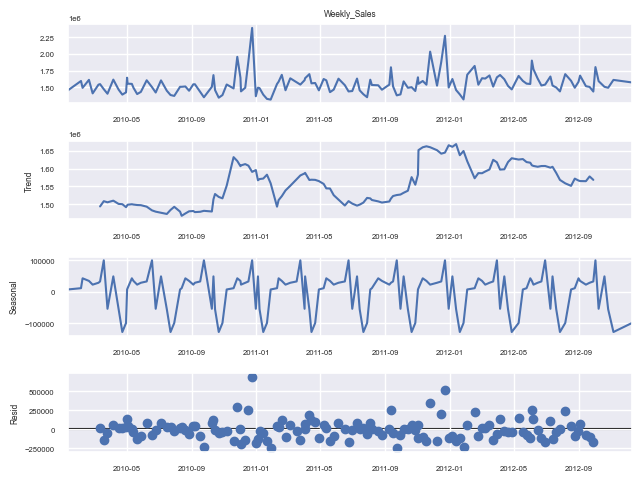

In [174]:
# Visualization of decomposition.

plt.figure(figsize = (20,10))
decomposition_store1.plot()
plt.show()

In [175]:
# Rolling mean and std dev for window = 10.

mean_store1 = sales_store1.rolling(window = 10).mean()
std_store1  = sales_store1.rolling(window = 10).std() 

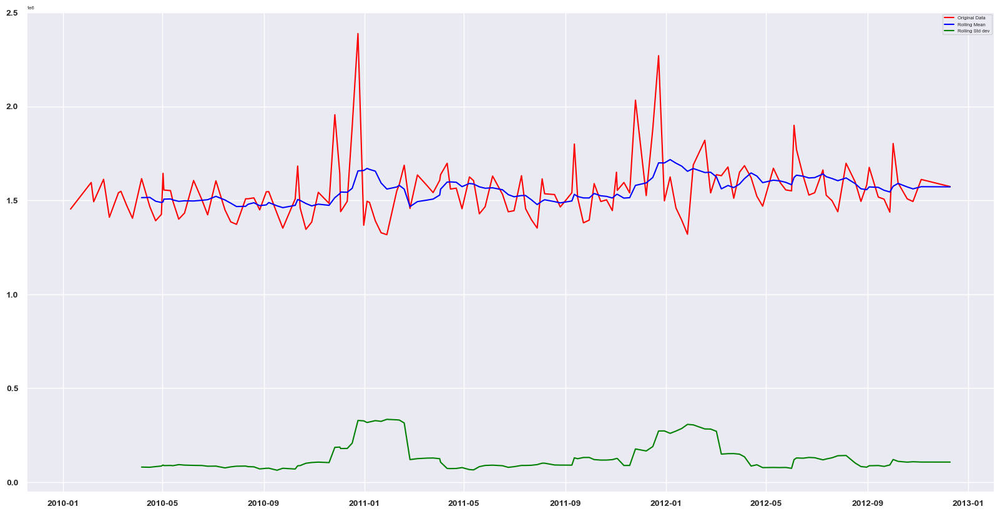

In [177]:
# Visualize the rolling mean and std dev with that of original data.

plt.figure(figsize = (20,10))
plt.plot(sales_store1, color = 'red', label = 'Original Data')
plt.plot(mean_store1, color = 'blue', label = 'Rolling Mean')
plt.plot(std_store1, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [178]:
# Apply log transformation.

store1_log = np.log(sales_store1)
store1_log

,Weekly_Sales
Date,
2010-01-10,14.189368
2010-02-04,14.282364
2010-02-07,14.215908
2010-02-19,14.292966
2010-02-26,14.158907
...,...
2012-10-08,14.280759
2012-10-19,14.226340
2012-10-26,14.216740


In [179]:
# Rolling mean and std dev for window = 10 for log transformed data.

mean1_store1 = store1_log.rolling(window = 10).mean()
std1_store1  = store1_log.rolling(window = 10).std()

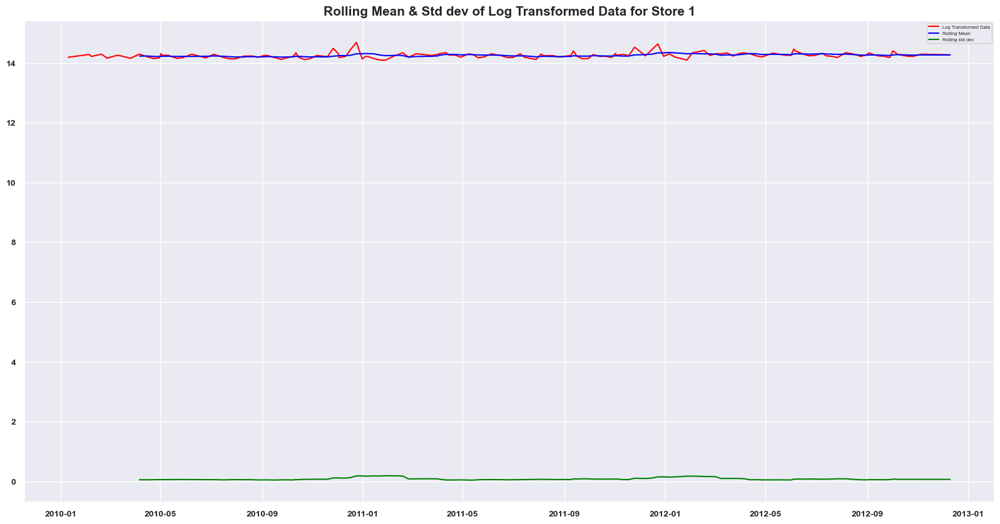

In [181]:
# Visualize the rolling mean and std dev with that of log transformed data.
plt.figure(figsize = (20,10))
plt.title('Rolling Mean & Std dev of Log Transformed Data for Store 1', fontsize = 15, fontweight = 'bold')
plt.plot(store1_log, color = 'red', label = 'Log Transformed Data')
plt.plot(mean1_store1, color = 'blue', label = 'Rolling Mean')
plt.plot(std1_store1, color = 'green', label = 'Rolling std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [182]:
# Call stationarity_check(dataframe,feature) function to perform ADF test on log transformed data.
stationarity_check(store1_log,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -9.474704e+00
p-value                 4.018547e-16
# Lags used             0.000000e+00
# Observations used     1.420000e+02
Critical Value (1%)    -3.477262e+00
Critical Value (5%)    -2.882118e+00
Critical Value (10%)   -2.577743e+00
dtype: float64

In [183]:
# Standardizing the data.
store1_scaled = store1_log - mean1_store1
store1_scaled

,Weekly_Sales
Date,
2010-01-10,NaN
2010-02-04,NaN
2010-02-07,NaN
2010-02-19,NaN
2010-02-26,NaN
...,...
2012-10-08,0.003490
2012-10-19,-0.039112
2012-10-26,-0.041969


In [184]:
# Dropping of nulls.
store1_scaled.dropna(inplace = True)

In [185]:
store1_scaled

,Weekly_Sales
Date,
2010-04-06,0.065950
2010-04-16,-0.032005
2010-04-23,-0.070710
2010-04-30,-0.042059
2010-05-02,0.098694
...,...
2012-10-08,0.003490
2012-10-19,-0.039112
2012-10-26,-0.041969


In [186]:
# Rolling mean and std dev for window = 10 for standardized data.

mean2_store1 = store1_scaled.rolling(window = 10).mean()
std2_store1  = store1_scaled.rolling(window = 10).std()

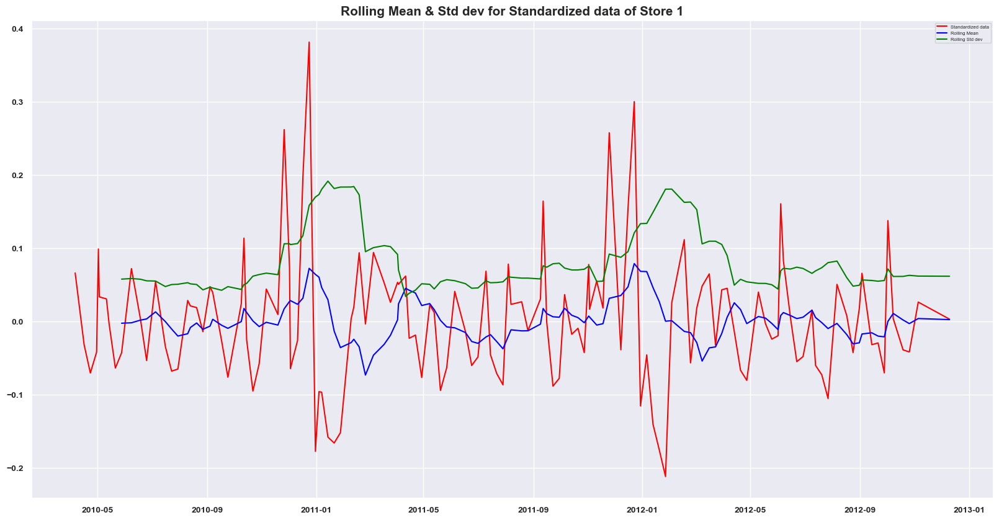

In [187]:
# Visualize the rolling mean and std dev with that of standardized data.
plt.figure(figsize = (20,10))
plt.title('Rolling Mean & Std dev for Standardized data of Store 1', fontsize = 15, fontweight = 'bold')
plt.plot(store1_scaled, color = 'red', label = 'Standardized data')
plt.plot(mean2_store1, color = 'blue', label = 'Rolling Mean')
plt.plot(std2_store1, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [188]:
# Call stationarity_check(dataframe,feature) function to perform ADF test.
stationarity_check(store1_scaled,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -6.254118e+00
p-value                 4.381186e-08
# Lags used             7.000000e+00
# Observations used     1.260000e+02
Critical Value (1%)    -3.483346e+00
Critical Value (5%)    -2.884766e+00
Critical Value (10%)   -2.579156e+00
dtype: float64

In [190]:
# Correlation of ACF & PACF at different lags.
store1_acf = acf(store1_scaled)
store1_pacf = pacf(store1_scaled)

print('Correlation at different lags for Store1 ACF :')
print(store1_acf)
print('Correlation at different lags for Store1 PACF :')
print(store1_pacf)

Correlation at different lags for Store1 ACF :
[ 1.          0.21766848 -0.08499688 -0.02850606  0.07004693 -0.10688304
 -0.2876006  -0.12314238 -0.18334128 -0.10135616 -0.11882509  0.00972374
  0.07152365  0.0954696   0.10051678  0.08738046  0.09018091  0.02941378
 -0.07607255 -0.12137719 -0.07189764  0.02255419]
Correlation at different lags for Store1 PACF :
[ 1.          0.21930509 -0.14116891  0.02507588  0.06583524 -0.15831412
 -0.24156659 -0.03118775 -0.26329756 -0.04184563 -0.15850696 -0.0379966
 -0.0329966   0.00493079 -0.03782292  0.01200001 -0.04242611 -0.01549084
 -0.15763513 -0.11663226 -0.08844433  0.05693698]


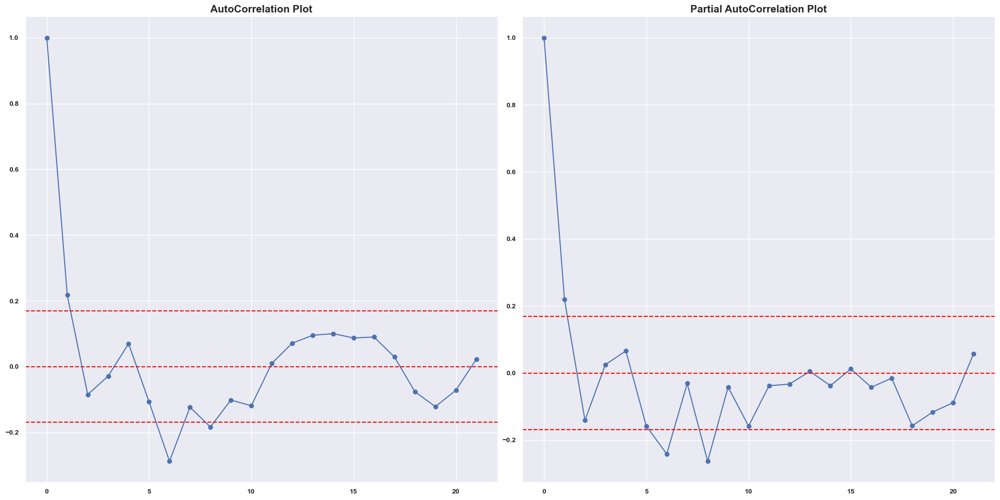

In [191]:
# Plot ACF & PACF to fetch p & q.

plt.figure(figsize = (20,10))
plt.subplot(1,2,1)
plt.title('AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(store1_acf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(store1_scaled)), linestyle = '--', color = 'red')  # 95% confidence interval band.
plt.axhline(y = 1.96/np.sqrt(len(store1_scaled)), linestyle = '--', color = 'red')   # 95% confidence interval band.
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()

plt.subplot(1,2,2)
plt.title('Partial AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(store1_pacf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(store1_scaled)), linestyle = '--', color = 'red')
plt.axhline(y = 1.96/np.sqrt(len(store1_scaled)), linestyle = '--', color = 'red')
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()
plt.show()

In [196]:
# Build ARIMA model using p,d,q.

p,d,q = 2,0,2
store1_model = ARIMA(store1_scaled, order = (p,d,q))
store1_fit = store1_model.fit()

# Perform Predictions on historical data.
store1_pred = store1_fit.predict()

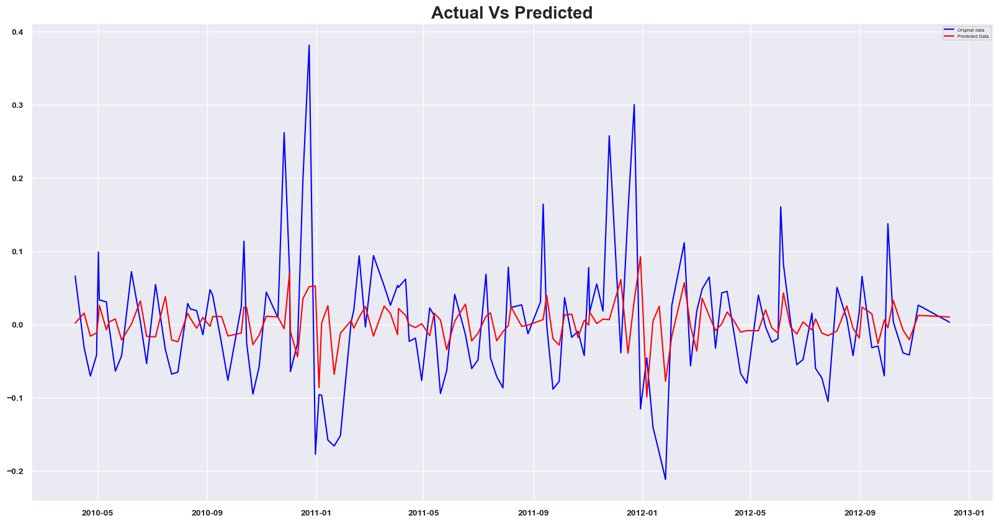

In [197]:
# Visualize Actual Vs Predicted Values.
plt.figure(figsize = (20,10))
plt.plot(store1_scaled, color = 'blue', label = 'Original data')
plt.plot(store1_pred, color = 'red', label = 'Predicted Data')
plt.title('Actual Vs Predicted', fontsize = 20, fontweight = 'bold')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [200]:
# Model Evaluation.
store1_mae = mean_absolute_error(store1_pred,store1_scaled)
print(f'Mean Absolute Error : {store1_mae}')
store1_mse = mean_squared_error(store1_pred,store1_scaled)
print(f'Mean Squared Error : {store1_mse}')
store1_rmse = np.sqrt(store1_mse)
print(f'Root Mean Squared Error : {store1_rmse}')

Mean Absolute Error : 0.060188728712498765
Mean Squared Error : 0.0071504819266096946
Root Mean Squared Error : 0.08456052227020416


In [216]:
# Sales Forecast for next 12 weeks.
forecast_weeks = 12
store1_forecast = store1_fit.forecast(steps = forecast_weeks)

In [213]:
# Get the end date of store 1.
sales_store1.index[-1]

Timestamp('2012-12-10 00:00:00')

In [226]:
# Generate a dataframe for the forecasted period.

store1_actual_end_date = sales_store1.index[-1]

store1_forecast_start_date = store1_actual_end_date + pd.DateOffset(days = 1)   
# days = 1 as we need to start forecasting from 11th Dec,2012 
store1_forecast_end_date = store1_forecast_start_date + pd.DateOffset(weeks = len(store1_forecast))
# weeks = len(store1_forecast) - denotes that weeks = 12.
store1_forecast_dates = pd.date_range(start = store1_forecast_start_date, end = store1_forecast_end_date, freq = 'W')

In [227]:
store1_forecast_dates

DatetimeIndex(['2012-12-16', '2012-12-23', '2012-12-30', '2013-01-06',
               '2013-01-13', '2013-01-20', '2013-01-27', '2013-02-03',
               '2013-02-10', '2013-02-17', '2013-02-24', '2013-03-03'],
              dtype='datetime64[ns]', freq='W-SUN')

In [228]:
store1_forecast_df = pd.DataFrame({
    'Date' : store1_forecast_dates,
    'Forecasted_Sales' : store1_forecast
})
store1_forecast_df

,Date,Forecasted_Sales
134,2012-12-16,-0.009993
135,2012-12-23,0.002980
136,2012-12-30,0.007368
137,2013-01-06,-0.002593
138,2013-01-13,0.000756
139,2013-01-20,0.004461
140,2013-01-27,0.000380
141,2013-02-03,0.000666
142,2013-02-10,0.002821
143,2013-02-17,0.001393


In [229]:
store1_forecast_df.set_index('Date', inplace = True)

In [230]:
store1_forecast_df

,Forecasted_Sales
Date,
2012-12-16,-0.009993
2012-12-23,0.002980
2012-12-30,0.007368
2013-01-06,-0.002593
2013-01-13,0.000756
2013-01-20,0.004461
2013-01-27,0.000380
2013-02-03,0.000666
2013-02-10,0.002821


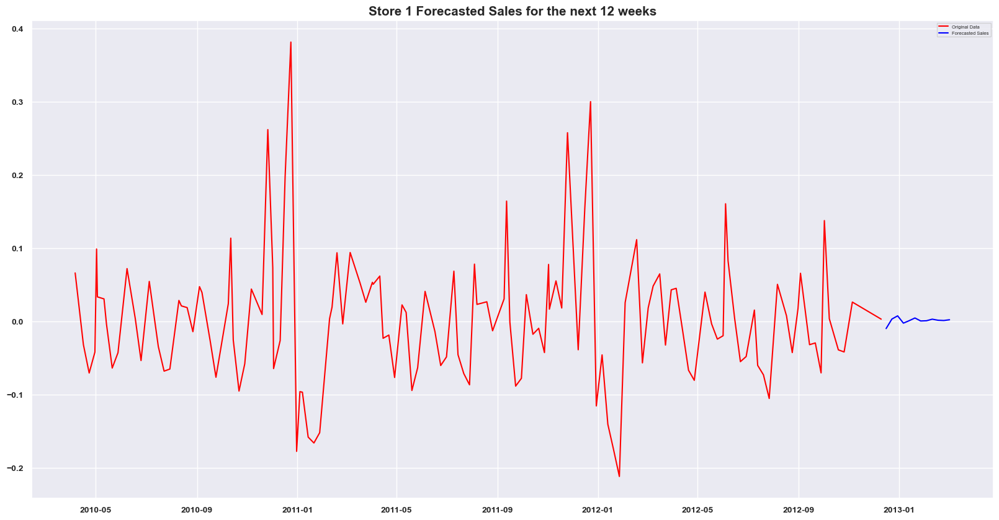

In [233]:
# Visualize the sales forecast.
plt.figure(figsize = (20,10))
plt.title('Store 1 Forecasted Sales for the next 12 weeks', fontsize = 15, fontweight = 'bold')
plt.plot(store1_scaled, color = 'red', label = 'Original Data')
plt.plot(store1_forecast_df, color = 'blue', label = 'Forecasted Sales')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

## Store 6 Sales Forecast for next 12 months

In [234]:
# Perform groupby based on date where store = 6.
sales_store6 = sales_copy[sales_copy['Store'] == 6].groupby('Date')['Weekly_Sales'].sum().reset_index()
sales_store6

,Date,Weekly_Sales
0,2010-01-10,1328468.89
1,2010-02-04,1770333.90
2,2010-02-07,1759777.25
3,2010-02-19,1567138.07
4,2010-02-26,1432953.21
...,...,...
137,2012-10-08,1588380.73
138,2012-10-19,1436883.99
139,2012-10-26,1431426.34
140,2012-11-05,1517075.67


In [235]:
# Set date as index.
sales_store6.set_index('Date', inplace = True)

In [236]:
sales_store6

,Weekly_Sales
Date,
2010-01-10,1328468.89
2010-02-04,1770333.90
2010-02-07,1759777.25
2010-02-19,1567138.07
2010-02-26,1432953.21
...,...
2012-10-08,1588380.73
2012-10-19,1436883.99
2012-10-26,1431426.34


In [237]:
# Call stationarity_check(dataframe,feature) function to perform ADF test.
stationarity_check(sales_store6,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -1.000565e+01
p-value                 1.834535e-17
# Lags used             0.000000e+00
# Observations used     1.410000e+02
Critical Value (1%)    -3.477601e+00
Critical Value (5%)    -2.882266e+00
Critical Value (10%)   -2.577822e+00
dtype: float64

In [238]:
# Decomposition technique to check for trends, seasonality & Noise.
decomposition_store6 = seasonal_decompose(sales_store6['Weekly_Sales'], period=13)

<Figure size 2000x1000 with 0 Axes>

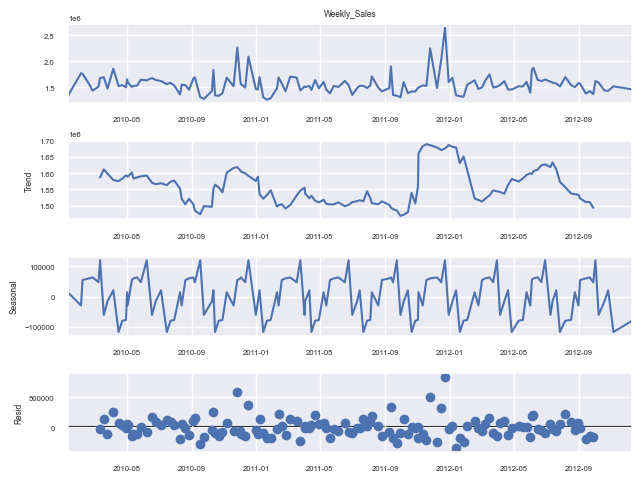

In [239]:
# Visualization of decomposition.
plt.figure(figsize = (20,10))
decomposition_store6.plot()
plt.show()

In [240]:
# Rolling mean and std dev for window = 10.
mean_store6 = sales_store6.rolling(window = 10).mean()
std_store6  = sales_store6.rolling(window = 10).std() 

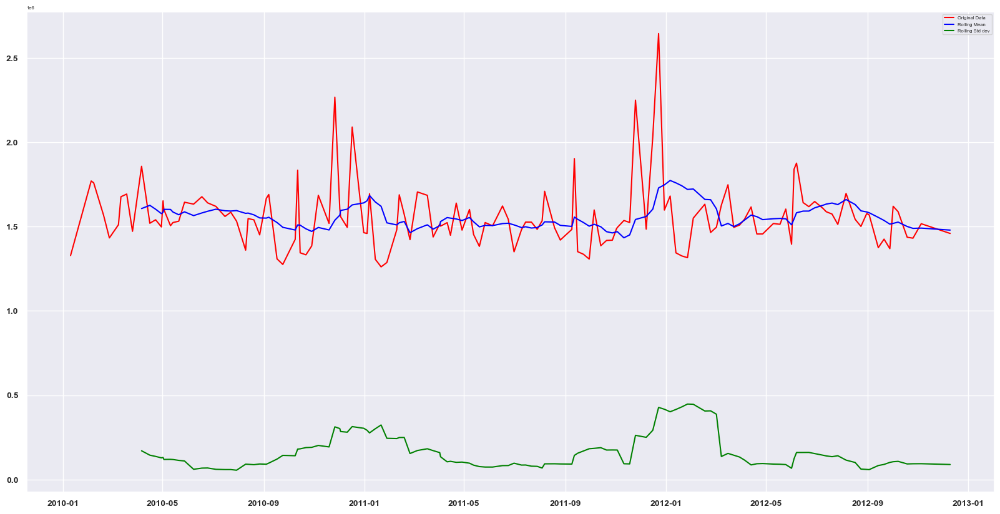

In [241]:
# Visualize the rolling mean and std dev with that of original data.
plt.figure(figsize = (20,10))
plt.plot(sales_store6, color = 'red', label = 'Original Data')
plt.plot(mean_store6, color = 'blue', label = 'Rolling Mean')
plt.plot(std_store6, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [242]:
# Apply log transformation.
store6_log = np.log(sales_store6)
store6_log

,Weekly_Sales
Date,
2010-01-10,14.099538
2010-02-04,14.386679
2010-02-07,14.380698
2010-02-19,14.264762
2010-02-26,14.175248
...,...
2012-10-08,14.278226
2012-10-19,14.177987
2012-10-26,14.174182


In [243]:
# Rolling mean and std dev for window = 10 for log transformed data.
mean1_store6 = store6_log.rolling(window = 10).mean()
std1_store6  = store6_log.rolling(window = 10).std()

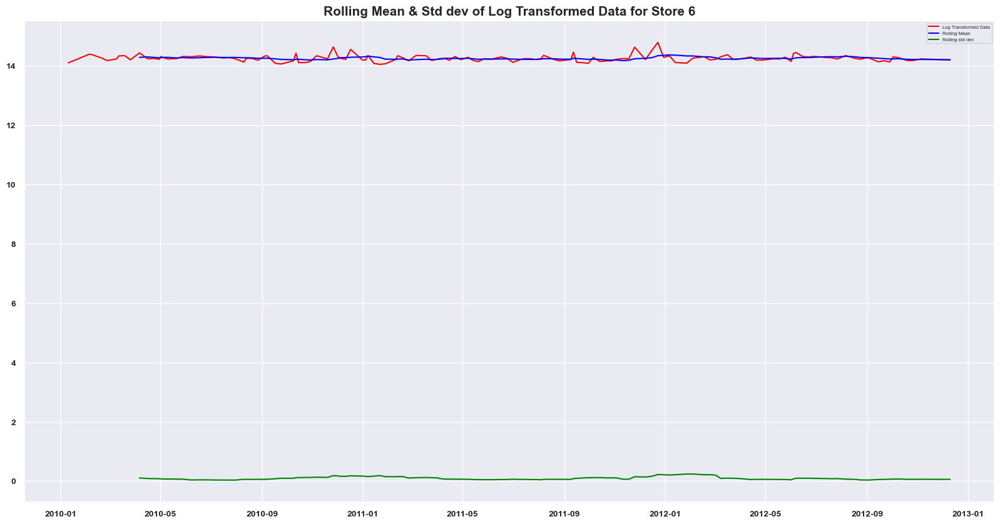

In [244]:
# Visualize the rolling mean and std dev with that of log transformed data.
plt.figure(figsize = (20,10))
plt.title('Rolling Mean & Std dev of Log Transformed Data for Store 6', fontsize = 15, fontweight = 'bold')
plt.plot(store6_log, color = 'red', label = 'Log Transformed Data')
plt.plot(mean1_store6, color = 'blue', label = 'Rolling Mean')
plt.plot(std1_store6, color = 'green', label = 'Rolling std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [245]:
# Call stationarity_check(dataframe,feature) function to perform ADF test on log transformed data.
stationarity_check(store6_log,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -9.862746e+00
p-value                 4.190871e-17
# Lags used             0.000000e+00
# Observations used     1.410000e+02
Critical Value (1%)    -3.477601e+00
Critical Value (5%)    -2.882266e+00
Critical Value (10%)   -2.577822e+00
dtype: float64

In [246]:
# Standardizing the data.
store6_scaled = store6_log - mean1_store6
store6_scaled

,Weekly_Sales
Date,
2010-01-10,NaN
2010-02-04,NaN
2010-02-07,NaN
2010-02-19,NaN
2010-02-26,NaN
...,...
2012-10-08,0.041926
2012-10-19,-0.041696
2012-10-26,-0.037993


In [247]:
# Dropping of nulls.
store6_scaled.dropna(inplace = True)

In [248]:
store6_scaled

,Weekly_Sales
Date,
2010-04-06,0.150018
2010-04-16,-0.063998
2010-04-23,-0.036631
2010-04-30,-0.048412
2010-05-02,0.044463
...,...
2012-10-08,0.041926
2012-10-19,-0.041696
2012-10-26,-0.037993


In [249]:
# Rolling mean and std dev for window = 10 for standardized data.
mean2_store6 = store6_scaled.rolling(window = 10).mean()
std2_store6  = store6_scaled.rolling(window = 10).std()

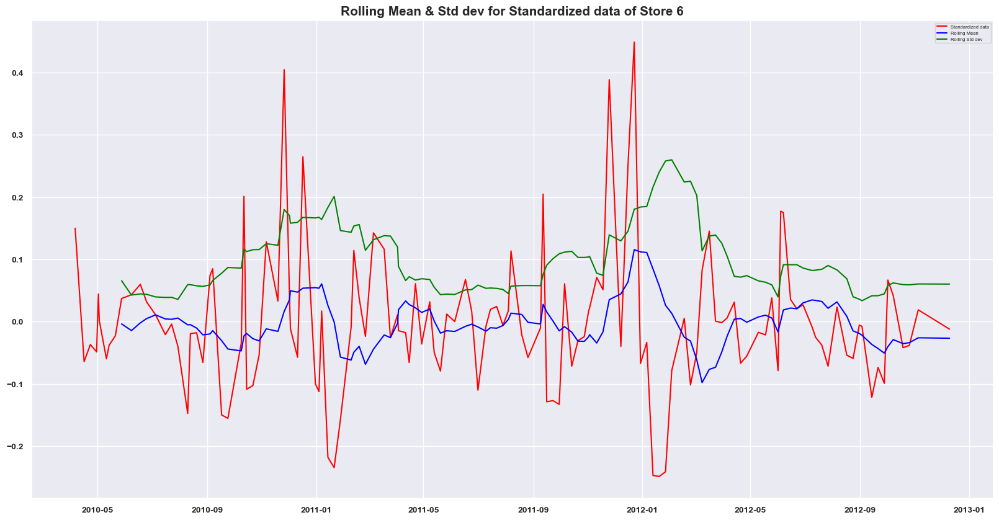

In [250]:
# Visualize the rolling mean and std dev with that of standardized data.
plt.figure(figsize = (20,10))
plt.title('Rolling Mean & Std dev for Standardized data of Store 6', fontsize = 15, fontweight = 'bold')
plt.plot(store6_scaled, color = 'red', label = 'Standardized data')
plt.plot(mean2_store6, color = 'blue', label = 'Rolling Mean')
plt.plot(std2_store6, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [251]:
# Call stationarity_check(dataframe,feature) function to perform ADF test.

stationarity_check(store6_scaled,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -6.214265e+00
p-value                 5.413646e-08
# Lags used             8.000000e+00
# Observations used     1.240000e+02
Critical Value (1%)    -3.484220e+00
Critical Value (5%)    -2.885145e+00
Critical Value (10%)   -2.579359e+00
dtype: float64

In [252]:
# Correlation of ACF & PACF at different lags.
store6_acf = acf(store6_scaled)
store6_pacf = pacf(store6_scaled)

print('Correlation at different lags for Store6 ACF :')
print(store6_acf)
print('Correlation at different lags for Store6 PACF :')
print(store6_pacf)

Correlation at different lags for Store6 ACF :
[ 1.          0.23962975  0.07329352  0.05448156  0.03851259 -0.18346321
 -0.22019409 -0.2230226  -0.22419397 -0.27161644 -0.09291086  0.06458327
  0.07323928 -0.00417744  0.03481219  0.0932956   0.03263412  0.06168918
  0.04988706 -0.12216409 -0.10162963  0.0130174 ]
Correlation at different lags for Store6 PACF :
[ 1.00000000e+00  2.41445130e-01  1.71144527e-02  3.60596426e-02
  1.82624744e-02 -2.20495082e-01 -1.55795513e-01 -1.57372663e-01
 -1.56128515e-01 -2.11493881e-01 -2.64031345e-02  6.71487229e-02
 -4.98021955e-05 -1.32460342e-01 -1.41707346e-01 -7.75624256e-02
 -1.18818734e-01  7.11195162e-03 -2.54700474e-02 -2.45021977e-01
 -1.31669427e-01 -3.36108971e-02]


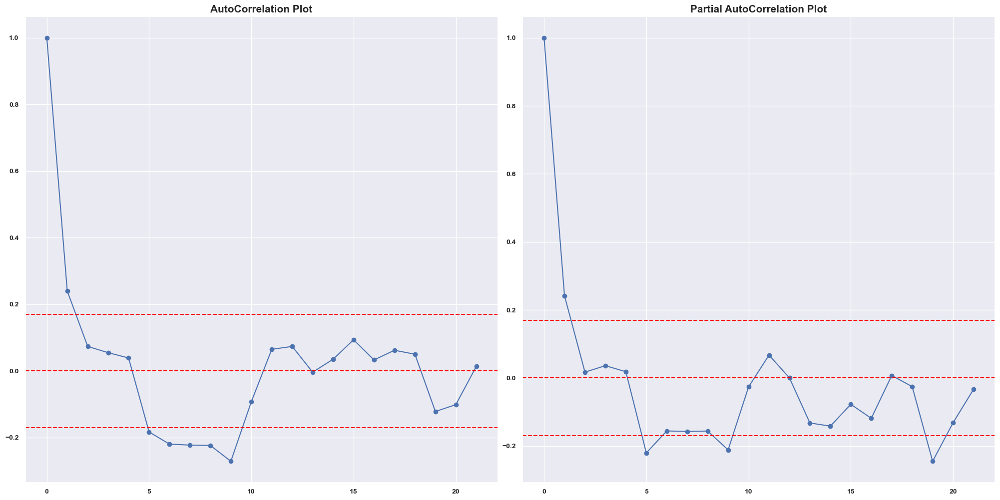

In [253]:
# Plot ACF & PACF to fetch p & q.
plt.figure(figsize = (20,10))
plt.subplot(1,2,1)
plt.title('AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(store6_acf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(store6_scaled)), linestyle = '--', color = 'red')  # 95% confidence interval band.
plt.axhline(y = 1.96/np.sqrt(len(store6_scaled)), linestyle = '--', color = 'red')   # 95% confidence interval band.
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()

plt.subplot(1,2,2)
plt.title('Partial AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(store6_pacf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(store6_scaled)), linestyle = '--', color = 'red')
plt.axhline(y = 1.96/np.sqrt(len(store6_scaled)), linestyle = '--', color = 'red')
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()
plt.show()

In [254]:
# Build ARIMA model using p,d,q.

p,d,q = 4,0,3
store6_model = ARIMA(store6_scaled, order = (p,d,q))
store6_fit = store6_model.fit()

# Perform Predictions on historical data.
store6_pred = store6_fit.predict()

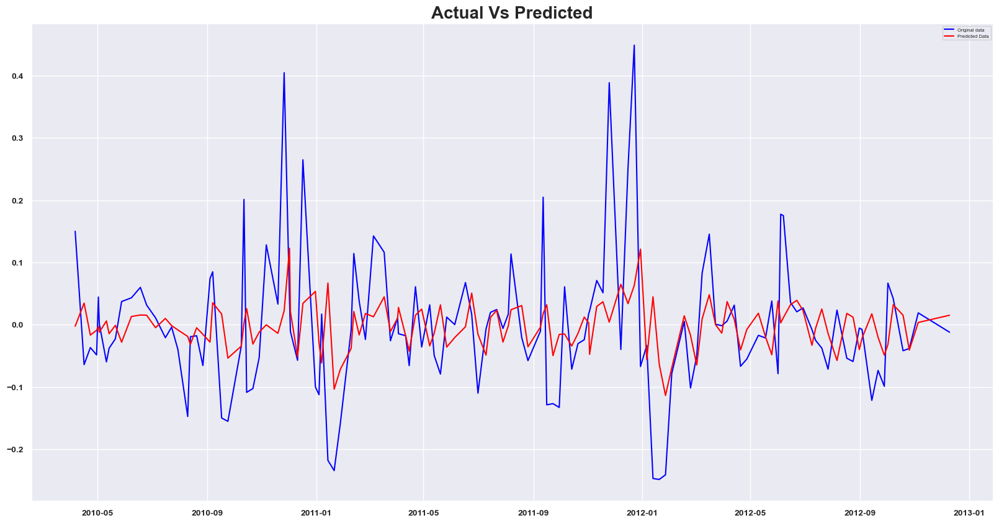

In [255]:
# Visualize Actual Vs Predicted Values.
plt.figure(figsize = (20,10))
plt.plot(store6_scaled, color = 'blue', label = 'Original data')
plt.plot(store6_pred, color = 'red', label = 'Predicted Data')
plt.title('Actual Vs Predicted', fontsize = 20, fontweight = 'bold')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [256]:
# Model Evaluation.
store6_mae = mean_absolute_error(store6_pred,store6_scaled)
print(f'Mean Absolute Error : {store6_mae}')
store6_mse = mean_squared_error(store6_pred,store6_scaled)
print(f'Mean Squared Error : {store6_mse}')
store6_rmse = np.sqrt(store6_mse)
print(f'Root Mean Squared Error : {store6_rmse}')

Mean Absolute Error : 0.07173837528299211
Mean Squared Error : 0.010851043214550236
Root Mean Squared Error : 0.10416834074972221


In [257]:
forecast_weeks

12

In [258]:
# Sales Forecast for next 12 weeks.
store6_forecast = store6_fit.forecast(steps = forecast_weeks)

In [259]:
# Get the end date of store 6.
sales_store6.index[-1]

Timestamp('2012-12-10 00:00:00')

In [260]:
# Generate a dataframe for the forecasted period.
store6_actual_end_date = sales_store6.index[-1]

store6_forecast_start_date = store6_actual_end_date + pd.DateOffset(days = 1)   
store6_forecast_end_date = store6_forecast_start_date + pd.DateOffset(weeks = len(store6_forecast))
store6_forecast_dates = pd.date_range(start = store6_forecast_start_date, end = store6_forecast_end_date, freq = 'W')

In [261]:
store6_forecast_dates

DatetimeIndex(['2012-12-16', '2012-12-23', '2012-12-30', '2013-01-06',
               '2013-01-13', '2013-01-20', '2013-01-27', '2013-02-03',
               '2013-02-10', '2013-02-17', '2013-02-24', '2013-03-03'],
              dtype='datetime64[ns]', freq='W-SUN')

In [262]:
store6_forecast_df = pd.DataFrame({
    'Date' : store6_forecast_dates,
    'Forecasted_Sales' : store6_forecast
})
store6_forecast_df

,Date,Forecasted_Sales
133,2012-12-16,-0.015535
134,2012-12-23,-0.023381
135,2012-12-30,0.016291
136,2013-01-06,0.003215
137,2013-01-13,-0.016139
138,2013-01-20,-0.010938
139,2013-01-27,0.019886
140,2013-02-03,-0.006189
141,2013-02-10,-0.017617
142,2013-02-17,0.000285


In [263]:
store6_forecast_df.set_index('Date', inplace = True)

In [264]:
store6_forecast_df

,Forecasted_Sales
Date,
2012-12-16,-0.015535
2012-12-23,-0.023381
2012-12-30,0.016291
2013-01-06,0.003215
2013-01-13,-0.016139
2013-01-20,-0.010938
2013-01-27,0.019886
2013-02-03,-0.006189
2013-02-10,-0.017617


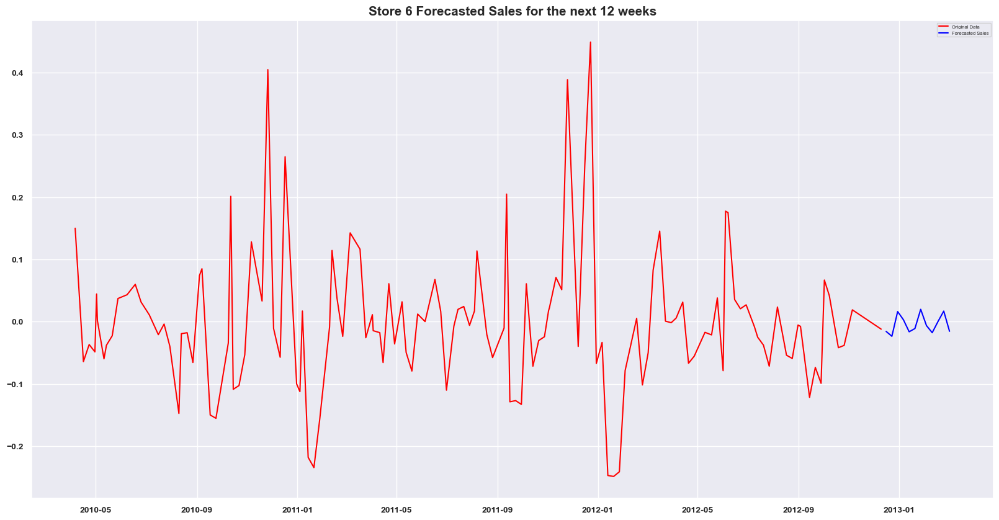

In [265]:
# Visualize the sales forecast.
plt.figure(figsize = (20,10))
plt.title('Store 6 Forecasted Sales for the next 12 weeks', fontsize = 15, fontweight = 'bold')
plt.plot(store6_scaled, color = 'red', label = 'Original Data')
plt.plot(store6_forecast_df, color = 'blue', label = 'Forecasted Sales')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

## Store 11 Sales Forecast for next 12 months

In [266]:
# Perform groupby based on date where store = 11.
sales_store11 = sales_copy[sales_copy['Store'] == 11].groupby('Date')['Weekly_Sales'].sum().reset_index()
sales_store11

,Date,Weekly_Sales
0,2010-01-10,1182490.46
1,2010-02-04,1446210.26
2,2010-02-07,1302600.14
3,2010-02-19,1503298.70
4,2010-02-26,1336404.65
...,...,...
138,2012-10-08,1388973.65
139,2012-10-19,1232073.18
140,2012-10-26,1200729.45
141,2012-11-05,1300147.07


In [267]:
# Set date as index.
sales_store11.set_index('Date', inplace = True)

In [268]:
sales_store11

,Weekly_Sales
Date,
2010-01-10,1182490.46
2010-02-04,1446210.26
2010-02-07,1302600.14
2010-02-19,1503298.70
2010-02-26,1336404.65
...,...
2012-10-08,1388973.65
2012-10-19,1232073.18
2012-10-26,1200729.45


In [269]:
# Call stationarity_check(dataframe,feature) function to perform ADF test.
stationarity_check(sales_store11,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -9.275603e+00
p-value                 1.291542e-15
# Lags used             0.000000e+00
# Observations used     1.420000e+02
Critical Value (1%)    -3.477262e+00
Critical Value (5%)    -2.882118e+00
Critical Value (10%)   -2.577743e+00
dtype: float64

In [270]:
# Decomposition technique to check for trends, seasonality & Noise.
decomposition_store11 = seasonal_decompose(sales_store11['Weekly_Sales'], period=13)

<Figure size 2000x1000 with 0 Axes>

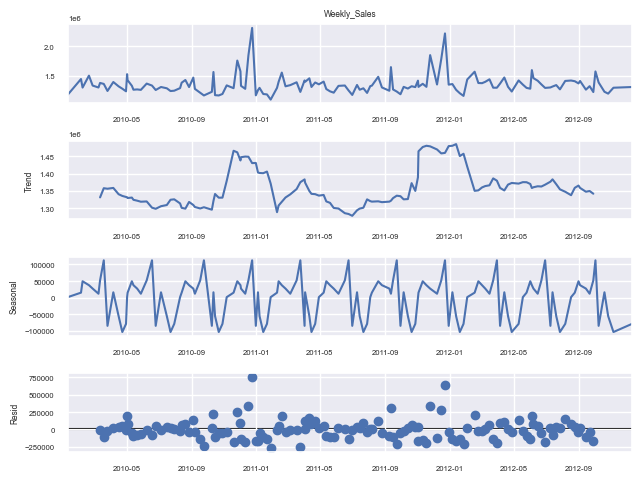

In [271]:
# Visualization of decomposition.
plt.figure(figsize = (20,10))
decomposition_store11.plot()
plt.show()

In [272]:
# Rolling mean and std dev for window = 10.
mean_store11 = sales_store11.rolling(window = 10).mean()
std_store11  = sales_store11.rolling(window = 10).std()

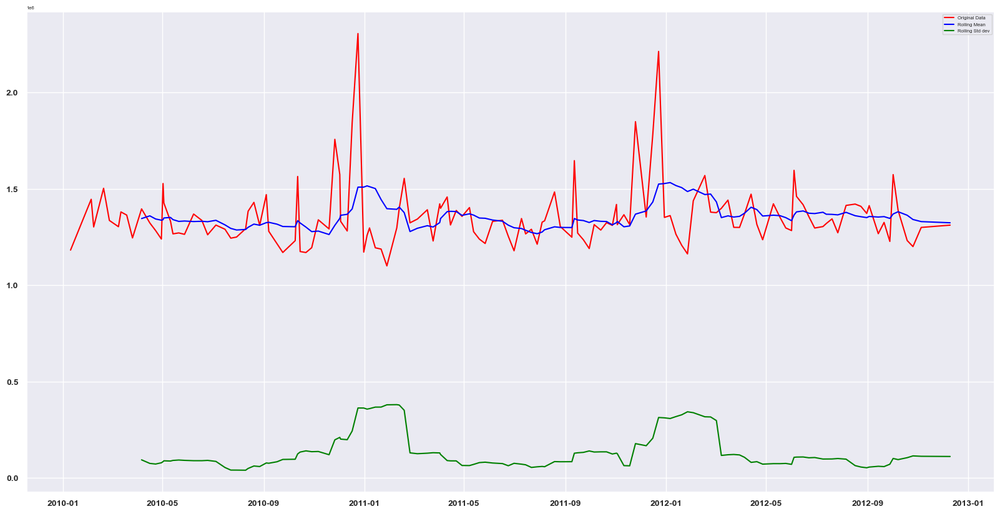

In [273]:
# Visualize the rolling mean and std dev with that of original data.
plt.figure(figsize = (20,10))
plt.plot(sales_store11, color = 'red', label = 'Original Data')
plt.plot(mean_store11, color = 'blue', label = 'Rolling Mean')
plt.plot(std_store11, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [274]:
# Apply log transformation.
store11_log = np.log(sales_store11)
store11_log

,Weekly_Sales
Date,
2010-01-10,13.983133
2010-02-04,14.184457
2010-02-07,14.079873
2010-02-19,14.223172
2010-02-26,14.105493
...,...
2012-10-08,14.144076
2012-10-19,14.024209
2012-10-26,13.998440


In [275]:
# Rolling mean and std dev for window = 10 for log transformed data.
mean1_store11 = store11_log.rolling(window = 10).mean()
std1_store11  = store11_log.rolling(window = 10).std()

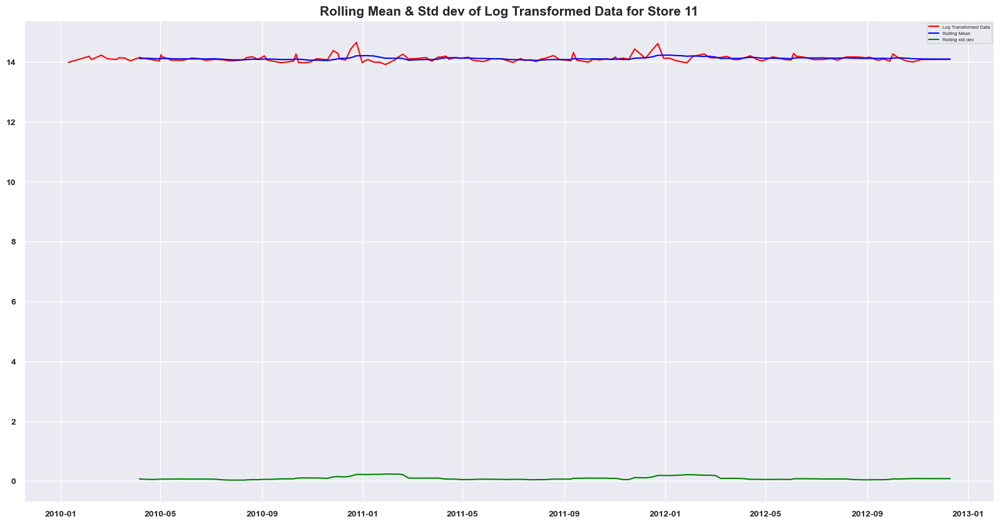

In [276]:
# Visualize the rolling mean and std dev with that of log transformed data.
plt.figure(figsize = (20,10))
plt.title('Rolling Mean & Std dev of Log Transformed Data for Store 11', fontsize = 15, fontweight = 'bold')
plt.plot(store11_log, color = 'red', label = 'Log Transformed Data')
plt.plot(mean1_store11, color = 'blue', label = 'Rolling Mean')
plt.plot(std1_store11, color = 'green', label = 'Rolling std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [277]:
# Call stationarity_check(dataframe,feature) function to perform ADF test on log transformed data.
stationarity_check(store11_log,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -9.287446e+00
p-value                 1.204757e-15
# Lags used             0.000000e+00
# Observations used     1.420000e+02
Critical Value (1%)    -3.477262e+00
Critical Value (5%)    -2.882118e+00
Critical Value (10%)   -2.577743e+00
dtype: float64

In [278]:
# Standardizing the data.
store11_scaled = store11_log - mean1_store11
store11_scaled

,Weekly_Sales
Date,
2010-01-10,NaN
2010-02-04,NaN
2010-02-07,NaN
2010-02-19,NaN
2010-02-26,NaN
...,...
2012-10-08,0.007453
2012-10-19,-0.098617
2012-10-26,-0.107522


In [279]:
# Dropping of nulls.
store11_scaled.dropna(inplace = True)

In [280]:
store11_scaled

,Weekly_Sales
Date,
2010-04-06,0.038796
2010-04-16,-0.026207
2010-04-23,-0.044579
2010-04-30,-0.074510
2010-05-02,0.132901
...,...
2012-10-08,0.007453
2012-10-19,-0.098617
2012-10-26,-0.107522


In [281]:
# Rolling mean and std dev for window = 10 for standardized data.
mean2_store11 = store11_scaled.rolling(window = 10).mean()
std2_store11  = store11_scaled.rolling(window = 10).std()

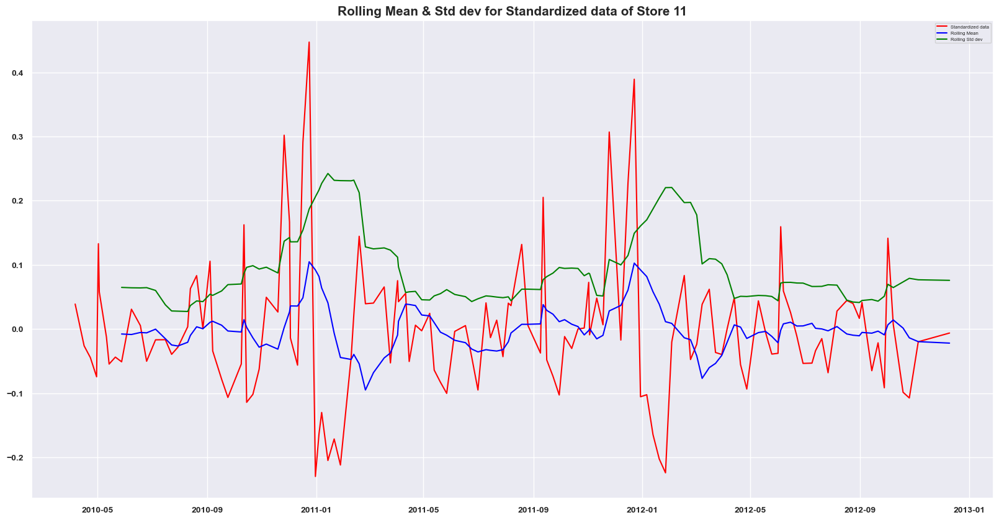

In [282]:
# Visualize the rolling mean and std dev with that of standardized data.
plt.figure(figsize = (20,10))
plt.title('Rolling Mean & Std dev for Standardized data of Store 11', fontsize = 15, fontweight = 'bold')
plt.plot(store11_scaled, color = 'red', label = 'Standardized data')
plt.plot(mean2_store11, color = 'blue', label = 'Rolling Mean')
plt.plot(std2_store11, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [283]:
# Call stationarity_check(dataframe,feature) function to perform ADF test.
stationarity_check(store11_scaled,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -6.013785e+00
p-value                 1.550978e-07
# Lags used             7.000000e+00
# Observations used     1.260000e+02
Critical Value (1%)    -3.483346e+00
Critical Value (5%)    -2.884766e+00
Critical Value (10%)   -2.579156e+00
dtype: float64

In [285]:
# Correlation of ACF & PACF at different lags.
store11_acf = acf(store11_scaled)
store11_pacf = pacf(store11_scaled)

print('Correlation at different lags for Store11 ACF :')
print(store11_acf)
print('Correlation at different lags for Store11 PACF :')
print(store11_pacf)

Correlation at different lags for Store11 ACF :
[ 1.          0.28236955 -0.00701229  0.01039558  0.01260911 -0.14592577
 -0.25741505 -0.1555202  -0.21884333 -0.18151576 -0.089774    0.01131601
 -0.00840361 -0.03546601  0.09950001  0.22361284  0.13785322  0.0510468
  0.0471045  -0.00214501 -0.06579043 -0.01251774]
Correlation at different lags for Store11 PACF :
[ 1.          0.28449263 -0.095809    0.04404633 -0.00404182 -0.16839902
 -0.1951805  -0.05645672 -0.22925229 -0.10052213 -0.08000956 -0.040297
 -0.11366234 -0.14056407 -0.01359337  0.10056078 -0.03013278 -0.02763668
 -0.03656563 -0.08678557 -0.06024594  0.0611867 ]


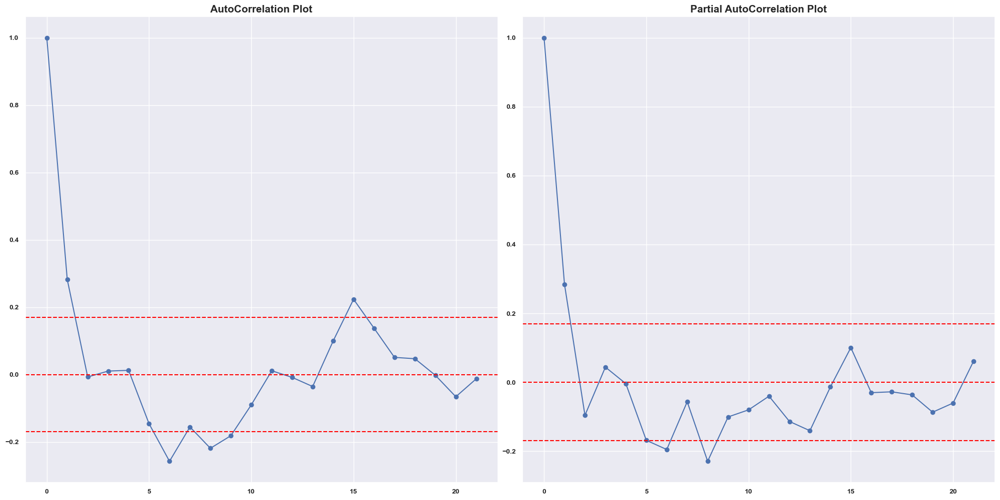

In [286]:
# Plot ACF & PACF to fetch p & q.
plt.figure(figsize = (20,10))
plt.subplot(1,2,1)
plt.title('AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(store11_acf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(store11_scaled)), linestyle = '--', color = 'red')  # 95% confidence interval band.
plt.axhline(y = 1.96/np.sqrt(len(store11_scaled)), linestyle = '--', color = 'red')   # 95% confidence interval band.
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()

plt.subplot(1,2,2)
plt.title('Partial AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(store11_pacf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(store11_scaled)), linestyle = '--', color = 'red')
plt.axhline(y = 1.96/np.sqrt(len(store11_scaled)), linestyle = '--', color = 'red')
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()
plt.show()

In [289]:
# Build ARIMA model using p,d,q.
p,d,q = 3,0,2
store11_model = ARIMA(store11_scaled, order = (p,d,q))
store11_fit = store11_model.fit()

# Perform Predictions on historical data.
store11_pred = store11_fit.predict()

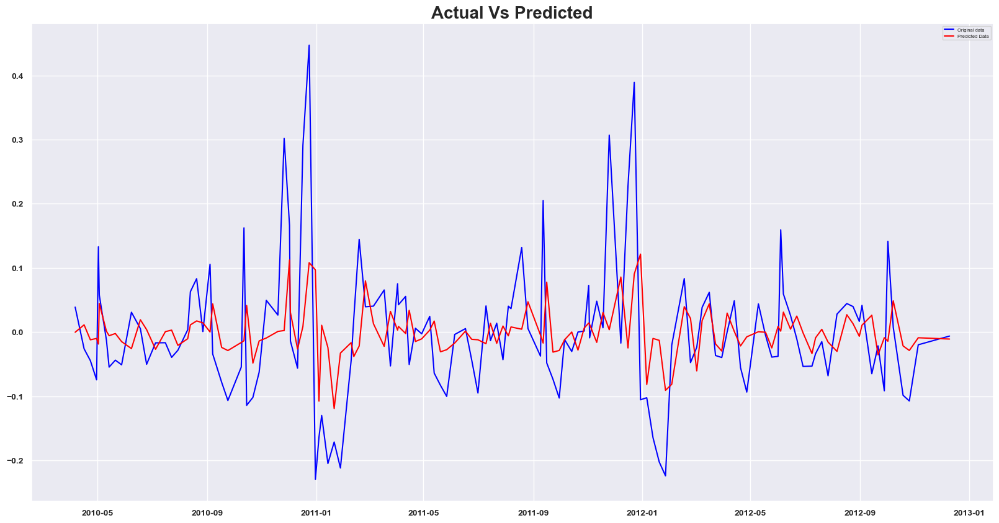

In [290]:
# Visualize Actual Vs Predicted Values.
plt.figure(figsize = (20,10))
plt.plot(store11_scaled, color = 'blue', label = 'Original data')
plt.plot(store11_pred, color = 'red', label = 'Predicted Data')
plt.title('Actual Vs Predicted', fontsize = 20, fontweight = 'bold')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [291]:
# Model Evaluation.
store11_mae = mean_absolute_error(store11_pred,store11_scaled)
print(f'Mean Absolute Error : {store11_mae}')
store11_mse = mean_squared_error(store11_pred,store11_scaled)
print(f'Mean Squared Error : {store11_mse}')
store11_rmse = np.sqrt(store11_mse)
print(f'Root Mean Squared Error : {store11_rmse}')

Mean Absolute Error : 0.0697686486933476
Mean Squared Error : 0.01002790686101929
Root Mean Squared Error : 0.1001394370915839


In [292]:
forecast_weeks

12

In [293]:
# Sales Forecast for next 12 weeks.
store11_forecast = store11_fit.forecast(steps = forecast_weeks)

In [294]:
# Get the end date of store 11.
sales_store11.index[-1]

Timestamp('2012-12-10 00:00:00')

In [295]:
# Generate a dataframe for the forecasted period.
store11_actual_end_date = sales_store11.index[-1]

store11_forecast_start_date = store11_actual_end_date + pd.DateOffset(days = 1)   
store11_forecast_end_date = store11_forecast_start_date + pd.DateOffset(weeks = len(store11_forecast))
store11_forecast_dates = pd.date_range(start = store11_forecast_start_date, end = store11_forecast_end_date, freq = 'W')

In [296]:
store11_forecast_dates

DatetimeIndex(['2012-12-16', '2012-12-23', '2012-12-30', '2013-01-06',
               '2013-01-13', '2013-01-20', '2013-01-27', '2013-02-03',
               '2013-02-10', '2013-02-17', '2013-02-24', '2013-03-03'],
              dtype='datetime64[ns]', freq='W-SUN')

In [297]:
store11_forecast_df = pd.DataFrame({
    'Date' : store11_forecast_dates,
    'Forecasted_Sales' : store11_forecast
})
store11_forecast_df

,Date,Forecasted_Sales
134,2012-12-16,-0.020093
135,2012-12-23,0.005289
136,2012-12-30,0.013781
137,2013-01-06,-0.011604
138,2013-01-13,-0.009441
139,2013-01-20,0.013536
140,2013-01-27,0.002821
141,2013-02-03,-0.014525
142,2013-02-10,0.002064
143,2013-02-17,0.011937


In [298]:
store11_forecast_df.set_index('Date', inplace = True)

In [299]:
store11_forecast_df

,Forecasted_Sales
Date,
2012-12-16,-0.020093
2012-12-23,0.005289
2012-12-30,0.013781
2013-01-06,-0.011604
2013-01-13,-0.009441
2013-01-20,0.013536
2013-01-27,0.002821
2013-02-03,-0.014525
2013-02-10,0.002064


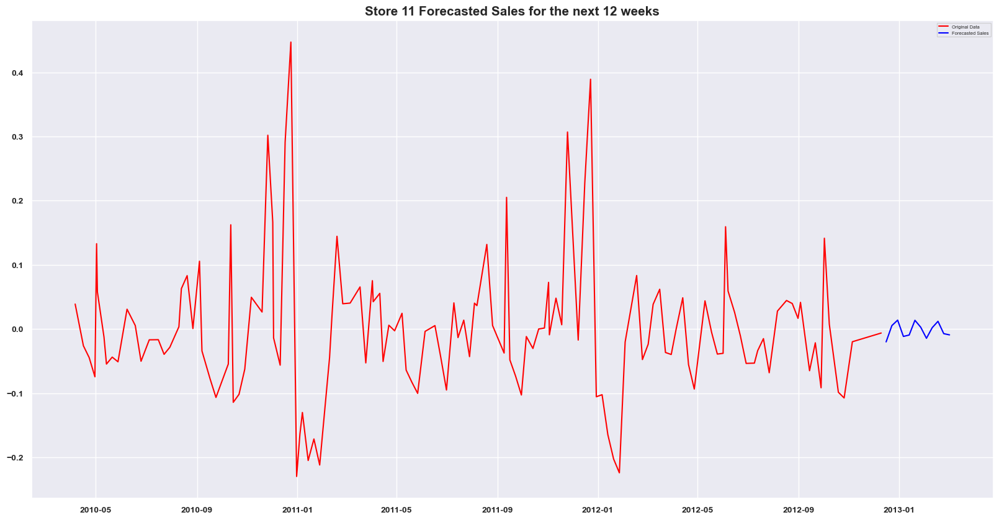

In [300]:
# Visualize the sales forecast.
plt.figure(figsize = (20,10))
plt.title('Store 11 Forecasted Sales for the next 12 weeks', fontsize = 15, fontweight = 'bold')
plt.plot(store11_scaled, color = 'red', label = 'Original Data')
plt.plot(store11_forecast_df, color = 'blue', label = 'Forecasted Sales')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

## Store 21 Sales Prediction for next 12 weeks

In [305]:
# Perform groupby based on date where store = 21.
sales_store21 = sales_copy[sales_copy['Store'] == 21].groupby('Date')['Weekly_Sales'].sum().reset_index()
sales_store21

,Date,Weekly_Sales
0,2010-01-10,677158.39
1,2010-02-04,753664.12
2,2010-02-07,711470.80
3,2010-02-19,867283.25
4,2010-02-26,749597.24
...,...,...
138,2012-10-08,700272.01
139,2012-10-19,641368.14
140,2012-10-26,675202.87
141,2012-11-05,649945.54


In [306]:
# Set date as index.
sales_store21.set_index('Date', inplace = True)

In [307]:
sales_store21

,Weekly_Sales
Date,
2010-01-10,677158.39
2010-02-04,753664.12
2010-02-07,711470.80
2010-02-19,867283.25
2010-02-26,749597.24
...,...
2012-10-08,700272.01
2012-10-19,641368.14
2012-10-26,675202.87


In [308]:
# Call stationarity_check(dataframe,feature) function to perform ADF test.
stationarity_check(sales_store21,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -8.954017e+00
p-value                 8.570754e-15
# Lags used             0.000000e+00
# Observations used     1.420000e+02
Critical Value (1%)    -3.477262e+00
Critical Value (5%)    -2.882118e+00
Critical Value (10%)   -2.577743e+00
dtype: float64

In [309]:
# Decomposition technique to check for trends, seasonality & Noise.
decomposition_store21 = seasonal_decompose(sales_store21['Weekly_Sales'], period=13)

<Figure size 2000x1000 with 0 Axes>

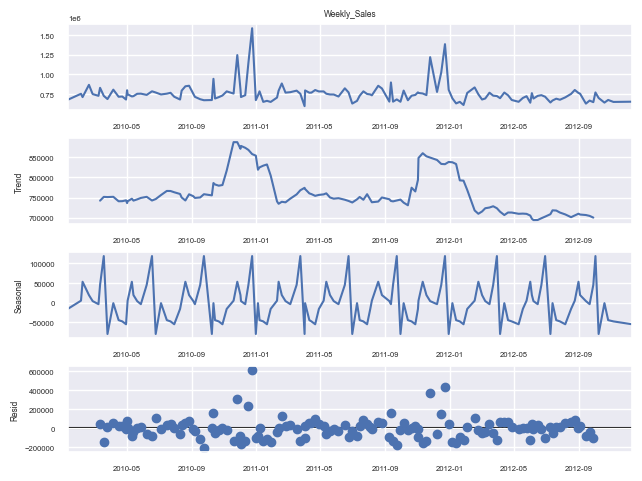

In [310]:
# Visualization of decomposition.
plt.figure(figsize = (20,10))
decomposition_store21.plot()
plt.show()

In [311]:
# Rolling mean and std dev for window = 10.
mean_store21 = sales_store21.rolling(window = 10).mean()
std_store21  = sales_store21.rolling(window = 10).std()

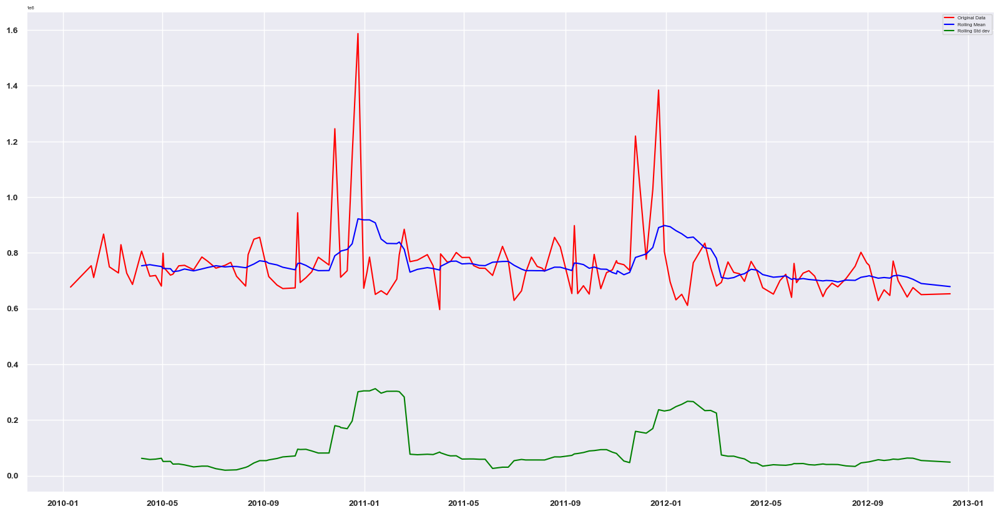

In [312]:
# Visualize the rolling mean and std dev with that of original data.
plt.figure(figsize = (20,10))
plt.plot(sales_store21, color = 'red', label = 'Original Data')
plt.plot(mean_store21, color = 'blue', label = 'Rolling Mean')
plt.plot(std_store21, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [313]:
# Apply log transformation.
store21_log = np.log(sales_store21)
store21_log

,Weekly_Sales
Date,
2010-01-10,13.425660
2010-02-04,13.532702
2010-02-07,13.475090
2010-02-19,13.673121
2010-02-26,13.527291
...,...
2012-10-08,13.459224
2012-10-19,13.371359
2012-10-26,13.422768


In [314]:
# Rolling mean and std dev for window = 10 for log transformed data.
mean1_store21 = store21_log.rolling(window = 10).mean()
std1_store21  = store21_log.rolling(window = 10).std()

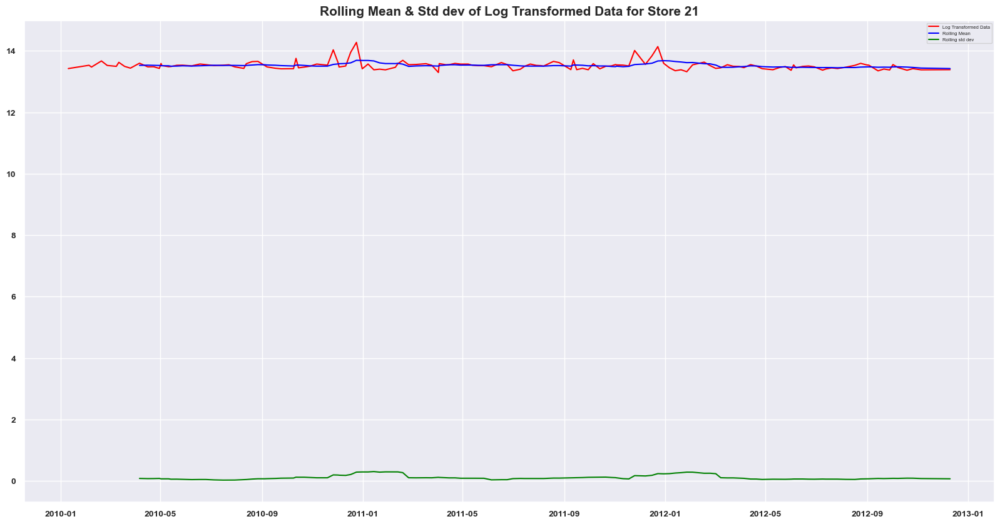

In [315]:
# Visualize the rolling mean and std dev with that of log transformed data.
plt.figure(figsize = (20,10))
plt.title('Rolling Mean & Std dev of Log Transformed Data for Store 21', fontsize = 15, fontweight = 'bold')
plt.plot(store21_log, color = 'red', label = 'Log Transformed Data')
plt.plot(mean1_store21, color = 'blue', label = 'Rolling Mean')
plt.plot(std1_store21, color = 'green', label = 'Rolling std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [316]:
# Call stationarity_check(dataframe,feature) function to perform ADF test on log transformed data.
stationarity_check(store21_log,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -8.789643e+00
p-value                 2.258768e-14
# Lags used             0.000000e+00
# Observations used     1.420000e+02
Critical Value (1%)    -3.477262e+00
Critical Value (5%)    -2.882118e+00
Critical Value (10%)   -2.577743e+00
dtype: float64

In [317]:
# Standardizing the data.
store21_scaled = store21_log - mean1_store21
store21_scaled

,Weekly_Sales
Date,
2010-01-10,NaN
2010-02-04,NaN
2010-02-07,NaN
2010-02-19,NaN
2010-02-26,NaN
...,...
2012-10-08,-0.024018
2012-10-19,-0.102014
2012-10-26,-0.039837


In [318]:
# Dropping of nulls.
store21_scaled.dropna(inplace = True)

In [319]:
store21_scaled

,Weekly_Sales
Date,
2010-04-06,0.070272
2010-04-16,-0.053692
2010-04-23,-0.045114
2010-04-30,-0.095348
2010-05-02,0.072880
...,...
2012-10-08,-0.024018
2012-10-19,-0.102014
2012-10-26,-0.039837


In [320]:
# Rolling mean and std dev for window = 10 for standardized data.
mean2_store21 = store21_scaled.rolling(window = 10).mean()
std2_store21  = store21_scaled.rolling(window = 10).std()

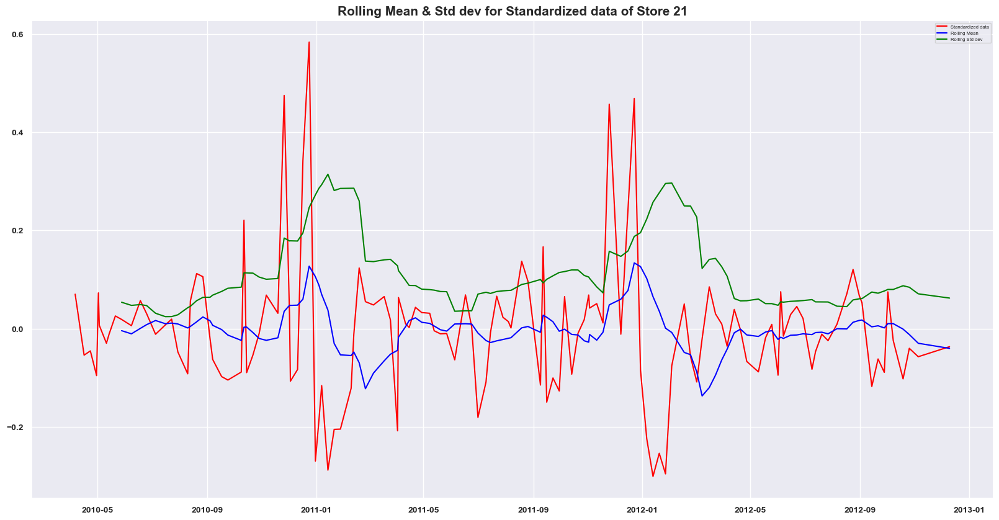

In [321]:
# Visualize the rolling mean and std dev with that of standardized data.
plt.figure(figsize = (20,10))
plt.title('Rolling Mean & Std dev for Standardized data of Store 21', fontsize = 15, fontweight = 'bold')
plt.plot(store21_scaled, color = 'red', label = 'Standardized data')
plt.plot(mean2_store21, color = 'blue', label = 'Rolling Mean')
plt.plot(std2_store21, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [322]:
# Call stationarity_check(dataframe,feature) function to perform ADF test.
stationarity_check(store21_scaled,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -8.674062e+00
p-value                 4.465416e-14
# Lags used             0.000000e+00
# Observations used     1.330000e+02
Critical Value (1%)    -3.480500e+00
Critical Value (5%)    -2.883528e+00
Critical Value (10%)   -2.578496e+00
dtype: float64

In [323]:
# Correlation of ACF & PACF at different lags.
store21_acf = acf(store21_scaled)
store21_pacf = pacf(store21_scaled)

print('Correlation at different lags for Store21 ACF :')
print(store21_acf)
print('Correlation at different lags for Store21 PACF :')
print(store21_pacf)

Correlation at different lags for Store21 ACF :
[ 1.00000000e+00  2.71169328e-01  9.89803125e-03  7.36340769e-03
 -2.78028023e-02 -1.14765612e-01 -1.65263303e-01 -1.52919995e-01
 -1.79532269e-01 -1.91950321e-01 -5.41153513e-02 -4.84935352e-04
 -3.13721708e-02 -2.67998742e-02  8.96734313e-03  7.39696862e-02
  6.43340702e-02  1.14185405e-01  8.99536143e-02 -1.88352806e-02
 -3.52357002e-02 -5.96394517e-02]
Correlation at different lags for Store21 PACF :
[ 1.          0.2732082  -0.06980516  0.02570082 -0.04033517 -0.10830912
 -0.12233991 -0.09766537 -0.14813343 -0.15326693 -0.00635022 -0.0449334
 -0.0933366  -0.08935951 -0.07922193 -0.00834674 -0.03958115  0.0508104
 -0.00938448 -0.09693216 -0.05829624 -0.11088843]


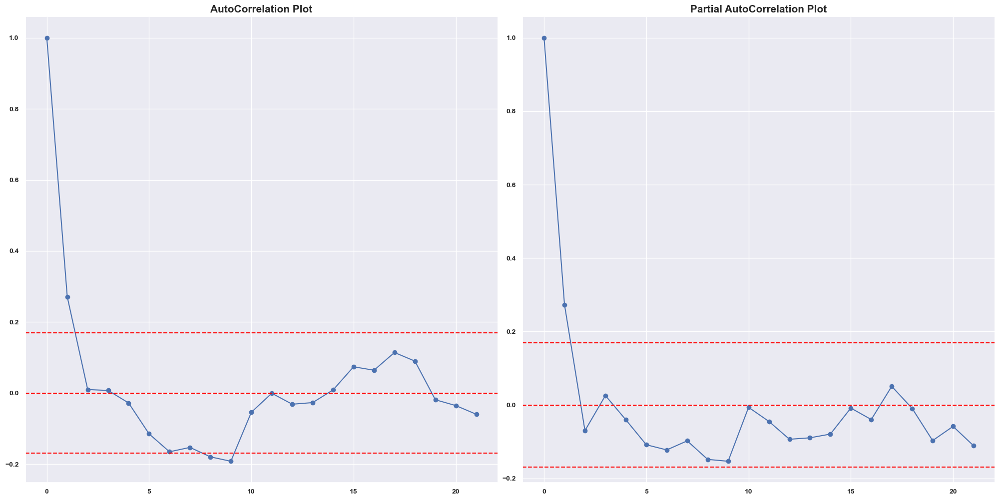

In [324]:
# Plot ACF & PACF to fetch p & q.
plt.figure(figsize = (20,10))
plt.subplot(1,2,1)
plt.title('AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(store21_acf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(store21_scaled)), linestyle = '--', color = 'red')  # 95% confidence interval band.
plt.axhline(y = 1.96/np.sqrt(len(store21_scaled)), linestyle = '--', color = 'red')   # 95% confidence interval band.
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()

plt.subplot(1,2,2)
plt.title('Partial AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(store21_pacf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(store21_scaled)), linestyle = '--', color = 'red')
plt.axhline(y = 1.96/np.sqrt(len(store21_scaled)), linestyle = '--', color = 'red')
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()
plt.show()

In [352]:
# Build ARIMA model using p,d,q.
p,d,q = 3,0,3
store21_model = ARIMA(store21_scaled, order = (p,d,q))
store21_fit = store21_model.fit()

# Perform Predictions on historical data.
store21_pred = store21_fit.predict()

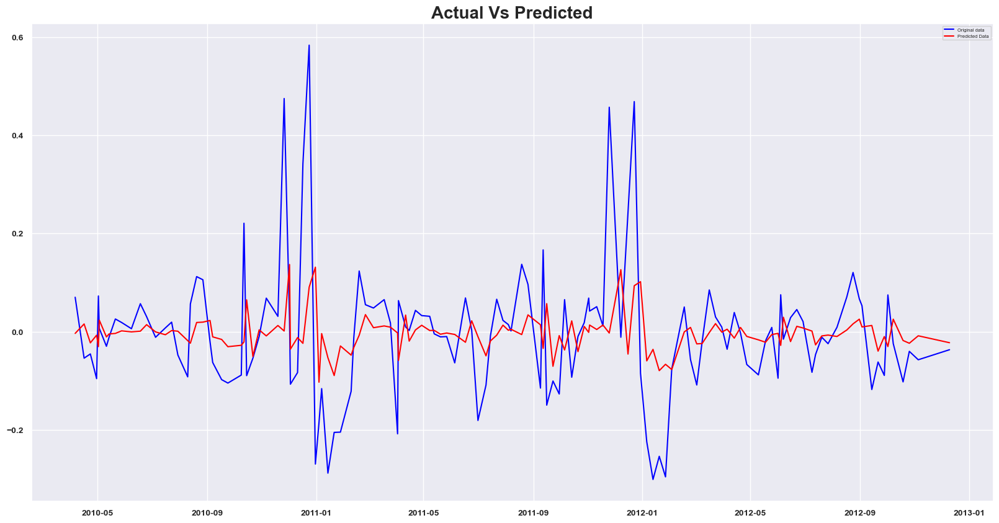

In [353]:
# Visualize Actual Vs Predicted Values.
plt.figure(figsize = (20,10))
plt.plot(store21_scaled, color = 'blue', label = 'Original data')
plt.plot(store21_pred, color = 'red', label = 'Predicted Data')
plt.title('Actual Vs Predicted', fontsize = 20, fontweight = 'bold')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [388]:
# Model Evaluation.
store21_mae = mean_absolute_error(store21_pred,store21_scaled)
print(f'Mean Absolute Error : {store21_mae}')
store21_mse = mean_squared_error(store21_pred,store21_scaled)
print(f'Mean Squared Error : {store21_mse}')
store21_rmse = np.sqrt(store21_mse)
print(f'Root Mean Squared Error : {store21_rmse}')

Mean Absolute Error : 0.08379216076406815
Mean Squared Error : 0.01633404924142127
Root Mean Squared Error : 0.12780473090391165


In [355]:
forecast_weeks

12

In [356]:
# Sales Forecast for next 12 weeks.
store21_forecast = store21_fit.forecast(steps = forecast_weeks)

In [392]:
# Get the end date of store 21.
sales_store21.index[-1]

Timestamp('2012-12-10 00:00:00')

In [358]:
# Generate a dataframe for the forecasted period.
store21_actual_end_date = sales_store21.index[-1]

store21_forecast_start_date = store21_actual_end_date + pd.DateOffset(days = 1)   
store21_forecast_end_date = store21_forecast_start_date + pd.DateOffset(weeks = len(store21_forecast))
store21_forecast_dates = pd.date_range(start = store21_forecast_start_date, end = store21_forecast_end_date, freq = 'W')

In [359]:
store21_forecast_dates

DatetimeIndex(['2012-12-16', '2012-12-23', '2012-12-30', '2013-01-06',
               '2013-01-13', '2013-01-20', '2013-01-27', '2013-02-03',
               '2013-02-10', '2013-02-17', '2013-02-24', '2013-03-03'],
              dtype='datetime64[ns]', freq='W-SUN')

In [360]:
store21_forecast_df = pd.DataFrame({
    'Date' : store21_forecast_dates,
    'Forecasted_Sales' : store21_forecast
})
store21_forecast_df

,Date,Forecasted_Sales
134,2012-12-16,-0.008099
135,2012-12-23,-0.001580
136,2012-12-30,-0.003245
137,2013-01-06,-0.004365
138,2013-01-13,-0.003346
139,2013-01-20,-0.002563
140,2013-01-27,-0.003148
141,2013-02-03,-0.003686
142,2013-02-10,-0.003357
143,2013-02-17,-0.002992


In [361]:
store21_forecast_df.set_index('Date', inplace = True)

In [362]:
store21_forecast_df

,Forecasted_Sales
Date,
2012-12-16,-0.008099
2012-12-23,-0.001580
2012-12-30,-0.003245
2013-01-06,-0.004365
2013-01-13,-0.003346
2013-01-20,-0.002563
2013-01-27,-0.003148
2013-02-03,-0.003686
2013-02-10,-0.003357


## Store 17 Sales Prediction for next 12 weeks.

In [364]:
# Perform groupby based on date where store = 17.
sales_store17 = sales_copy[sales_copy['Store'] == 17].groupby('Date')['Weekly_Sales'].sum().reset_index()
sales_store17

,Date,Weekly_Sales
0,2010-01-10,829207.27
1,2010-02-04,848521.17
2,2010-02-07,958875.37
3,2010-02-19,800714.00
4,2010-02-26,749549.55
...,...,...
137,2012-10-08,849074.04
138,2012-10-19,957356.84
139,2012-10-26,943465.29
140,2012-11-05,944100.30


In [365]:
# Set date as index.
sales_store17.set_index('Date', inplace = True)

In [366]:
sales_store17

,Weekly_Sales
Date,
2010-01-10,829207.27
2010-02-04,848521.17
2010-02-07,958875.37
2010-02-19,800714.00
2010-02-26,749549.55
...,...
2012-10-08,849074.04
2012-10-19,957356.84
2012-10-26,943465.29


In [367]:
# Call stationarity_check(dataframe,feature) function to perform ADF test.
stationarity_check(sales_store17,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                  -4.765504
p-value                   0.000063
# Lags used               2.000000
# Observations used     139.000000
Critical Value (1%)      -3.478294
Critical Value (5%)      -2.882568
Critical Value (10%)     -2.577983
dtype: float64

In [368]:
# Decomposition technique to check for trends, seasonality & Noise.
decomposition_store17 = seasonal_decompose(sales_store17['Weekly_Sales'], period=13)

<Figure size 2000x1000 with 0 Axes>

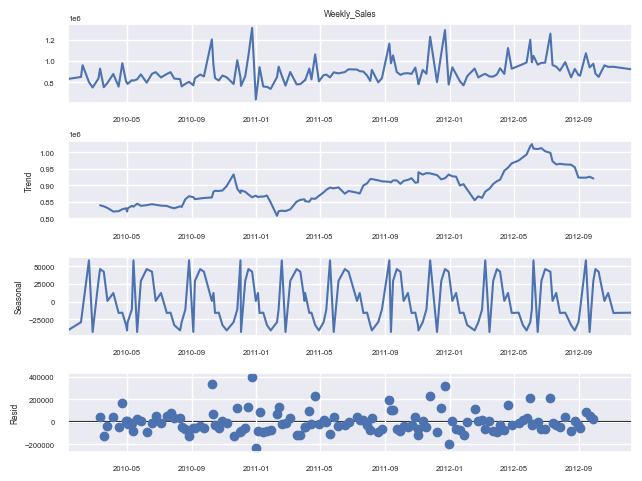

In [369]:
# Visualization of decomposition.
plt.figure(figsize = (20,10))
decomposition_store17.plot()
plt.show()

In [370]:
# Rolling mean and std dev for window = 10.
mean_store17 = sales_store17.rolling(window = 10).mean()
std_store17  = sales_store17.rolling(window = 10).std()

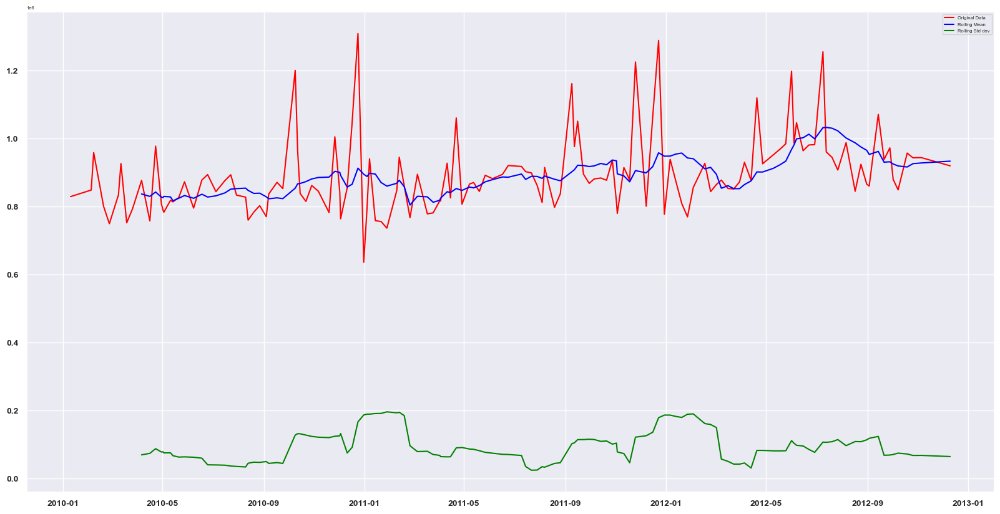

In [371]:
# Visualize the rolling mean and std dev with that of original data.
plt.figure(figsize = (20,10))
plt.plot(sales_store17, color = 'red', label = 'Original Data')
plt.plot(mean_store17, color = 'blue', label = 'Rolling Mean')
plt.plot(std_store17, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [372]:
# Apply log transformation.
store17_log = np.log(sales_store17)
store17_log

,Weekly_Sales
Date,
2010-01-10,13.628225
2010-02-04,13.651250
2010-02-07,13.773516
2010-02-19,13.593259
2010-02-26,13.527228
...,...
2012-10-08,13.651902
2012-10-19,13.771931
2012-10-26,13.757315


In [373]:
# Rolling mean and std dev for window = 10 for log transformed data.
mean1_store17 = store17_log.rolling(window = 10).mean()
std1_store17  = store17_log.rolling(window = 10).std()

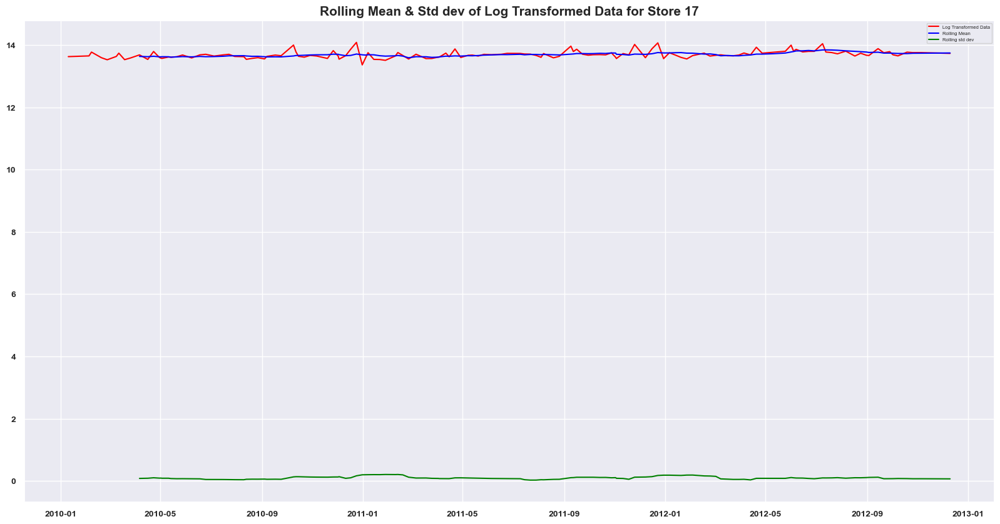

In [374]:
# Visualize the rolling mean and std dev with that of log transformed data.
plt.figure(figsize = (20,10))
plt.title('Rolling Mean & Std dev of Log Transformed Data for Store 17', fontsize = 15, fontweight = 'bold')
plt.plot(store17_log, color = 'red', label = 'Log Transformed Data')
plt.plot(mean1_store17, color = 'blue', label = 'Rolling Mean')
plt.plot(std1_store17, color = 'green', label = 'Rolling std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [375]:
# Call stationarity_check(dataframe,feature) function to perform ADF test on log transformed data.
stationarity_check(store17_log,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                  -4.634083
p-value                   0.000112
# Lags used               2.000000
# Observations used     139.000000
Critical Value (1%)      -3.478294
Critical Value (5%)      -2.882568
Critical Value (10%)     -2.577983
dtype: float64

In [376]:
# Standardizing the data.
store17_scaled = store17_log - mean1_store17
store17_scaled

,Weekly_Sales
Date,
2010-01-10,NaN
2010-02-04,NaN
2010-02-07,NaN
2010-02-19,NaN
2010-02-26,NaN
...,...
2012-10-08,-0.076830
2012-10-19,0.046350
2012-10-26,0.020702


In [377]:
# Dropping of nulls.
store17_scaled.dropna(inplace = True)

In [378]:
store17_scaled

,Weekly_Sales
Date,
2010-04-06,0.049596
2010-04-16,-0.087448
2010-04-23,0.153329
2010-04-30,-0.020509
2010-05-02,-0.042541
...,...
2012-10-08,-0.076830
2012-10-19,0.046350
2012-10-26,0.020702


In [379]:
# Rolling mean and std dev for window = 10 for standardized data.
mean2_store17 = store17_scaled.rolling(window = 10).mean()
std2_store17  = store17_scaled.rolling(window = 10).std()

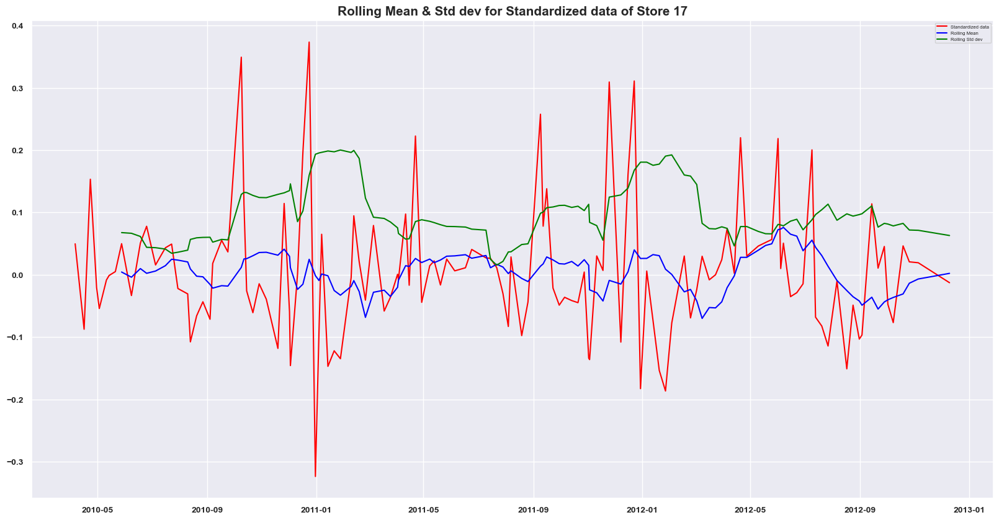

In [380]:
# Visualize the rolling mean and std dev with that of standardized data.
plt.figure(figsize = (20,10))
plt.title('Rolling Mean & Std dev for Standardized data of Store 17', fontsize = 15, fontweight = 'bold')
plt.plot(store17_scaled, color = 'red', label = 'Standardized data')
plt.plot(mean2_store17, color = 'blue', label = 'Rolling Mean')
plt.plot(std2_store17, color = 'green', label = 'Rolling Std dev')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [381]:
# Call stationarity_check(dataframe,feature) function to perform ADF test.
stationarity_check(store17_scaled,'Weekly_Sales')

Augmented Dickey Fuller Test (ADF Test)
Data is stationary


T-stats                -6.122639e+00
p-value                 8.780129e-08
# Lags used             5.000000e+00
# Observations used     1.270000e+02
Critical Value (1%)    -3.482920e+00
Critical Value (5%)    -2.884580e+00
Critical Value (10%)   -2.579058e+00
dtype: float64

In [382]:
# Correlation of ACF & PACF at different lags.
store17_acf = acf(store17_scaled)
store17_pacf = pacf(store17_scaled)

print('Correlation at different lags for Store17 ACF :')
print(store17_acf)
print('Correlation at different lags for Store17 PACF :')
print(store17_pacf)

Correlation at different lags for Store17 ACF :
[ 1.          0.07242898  0.00343726  0.0702552  -0.08162889 -0.04523497
 -0.25743062 -0.07336346 -0.07810166 -0.09965499  0.01932526  0.14709975
  0.0196178  -0.04544169 -0.01095864 -0.04619514 -0.01711853 -0.12935619
 -0.07922247 -0.01836073 -0.0390155   0.04703934]
Correlation at different lags for Store17 PACF :
[ 1.          0.07297769 -0.00184584  0.07214049 -0.09566952 -0.03364874
 -0.27498383 -0.02792261 -0.09504961 -0.06545514 -0.01765105  0.15874873
 -0.0819948  -0.09281725 -0.09681584 -0.08601132 -0.02808632 -0.10619669
 -0.10522936 -0.06411508 -0.06587805 -0.03073221]


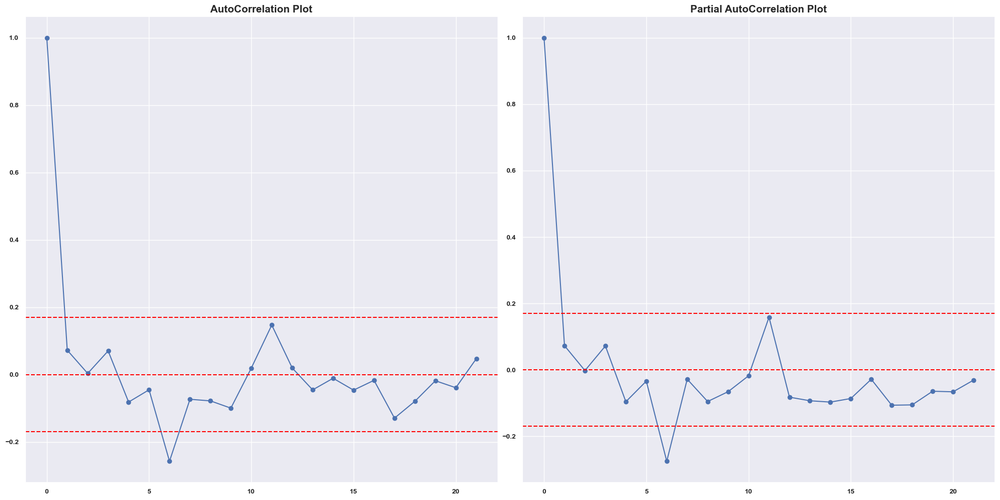

In [383]:
# Plot ACF & PACF to fetch p & q.
plt.figure(figsize = (20,10))
plt.subplot(1,2,1)
plt.title('AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(store17_acf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(store17_scaled)), linestyle = '--', color = 'red')  # 95% confidence interval band.
plt.axhline(y = 1.96/np.sqrt(len(store17_scaled)), linestyle = '--', color = 'red')   # 95% confidence interval band.
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()

plt.subplot(1,2,2)
plt.title('Partial AutoCorrelation Plot', fontsize = 15, fontweight = 'bold')
plt.plot(store17_pacf, marker = 'o')
plt.axhline(y = 0, linestyle = '--', color = 'red')
plt.axhline(y = -1.96/np.sqrt(len(store17_scaled)), linestyle = '--', color = 'red')
plt.axhline(y = 1.96/np.sqrt(len(store17_scaled)), linestyle = '--', color = 'red')
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.tight_layout()
plt.show()

In [386]:
# Build ARIMA model using p,d,q.
p,d,q = 3,1,3
store17_model = ARIMA(store17_scaled, order = (p,d,q))
store17_fit = store17_model.fit()

# Perform Predictions on historical data.
store17_pred = store17_fit.predict()

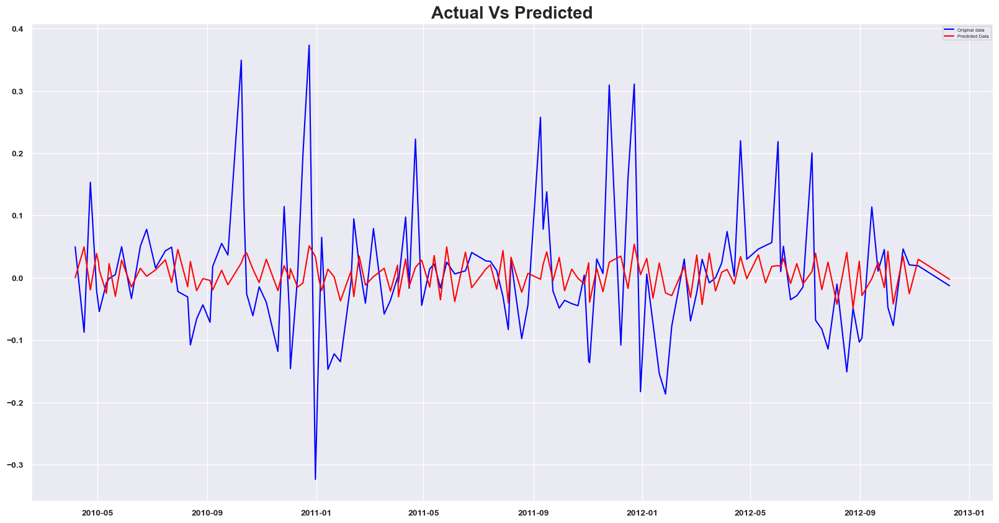

In [387]:
# Visualize Actual Vs Predicted Values.
plt.figure(figsize = (20,10))
plt.plot(store17_scaled, color = 'blue', label = 'Original data')
plt.plot(store17_pred, color = 'red', label = 'Predicted Data')
plt.title('Actual Vs Predicted', fontsize = 20, fontweight = 'bold')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()

In [389]:
# Model Evaluation.
store17_mae = mean_absolute_error(store17_pred,store17_scaled)
print(f'Mean Absolute Error : {store17_mae}')
store17_mse = mean_squared_error(store17_pred,store17_scaled)
print(f'Mean Squared Error : {store17_mse}')
store17_rmse = np.sqrt(store17_mse)
print(f'Root Mean Squared Error : {store17_rmse}')

Mean Absolute Error : 0.07391066443551499
Mean Squared Error : 0.01067659240568185
Root Mean Squared Error : 0.10332759750270908


In [390]:
forecast_weeks

12

In [391]:
# Sales Forecast for next 12 weeks.
store17_forecast = store17_fit.forecast(steps = forecast_weeks)

In [393]:
# Get the end date of store 1.
sales_store17.index[-1]

Timestamp('2012-12-10 00:00:00')

In [394]:
# Generate a dataframe for the forecasted period.
store17_actual_end_date = sales_store17.index[-1]

store17_forecast_start_date = store17_actual_end_date + pd.DateOffset(days = 1)   
store17_forecast_end_date = store17_forecast_start_date + pd.DateOffset(weeks = len(store17_forecast))
store17_forecast_dates = pd.date_range(start = store17_forecast_start_date, end = store17_forecast_end_date, freq = 'W')

In [395]:
store17_forecast_dates

DatetimeIndex(['2012-12-16', '2012-12-23', '2012-12-30', '2013-01-06',
               '2013-01-13', '2013-01-20', '2013-01-27', '2013-02-03',
               '2013-02-10', '2013-02-17', '2013-02-24', '2013-03-03'],
              dtype='datetime64[ns]', freq='W-SUN')

In [396]:
store17_forecast_df = pd.DataFrame({
    'Date' : store17_forecast_dates,
    'Forecasted_Sales' : store17_forecast
})
store17_forecast_df

,Date,Forecasted_Sales
133,2012-12-16,-0.005488
134,2012-12-23,0.025108
135,2012-12-30,-0.026193
136,2013-01-06,0.038413
137,2013-01-13,-0.028286
138,2013-01-20,0.029279
139,2013-01-27,-0.009565
140,2013-02-03,0.004233
141,2013-02-10,0.017519
142,2013-02-17,-0.020306


In [397]:
store17_forecast_df.set_index('Date', inplace = True)

In [398]:
store17_forecast_df

,Forecasted_Sales
Date,
2012-12-16,-0.005488
2012-12-23,0.025108
2012-12-30,-0.026193
2013-01-06,0.038413
2013-01-13,-0.028286
2013-01-20,0.029279
2013-01-27,-0.009565
2013-02-03,0.004233
2013-02-10,0.017519


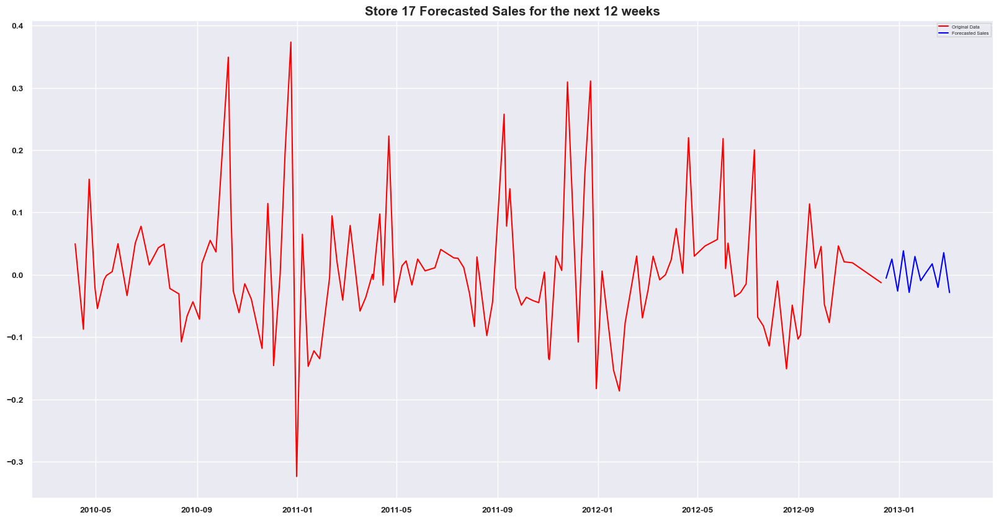

In [399]:
# Visualize the sales forecast.
plt.figure(figsize = (20,10))
plt.title('Store 17 Forecasted Sales for the next 12 weeks', fontsize = 15, fontweight = 'bold')
plt.plot(store17_scaled, color = 'red', label = 'Original Data')
plt.plot(store17_forecast_df, color = 'blue', label = 'Forecasted Sales')
plt.legend()
plt.xticks(fontsize = 10, fontweight = 'bold')
plt.yticks(fontsize = 10, fontweight = 'bold')
plt.show()